In [1]:
import pandas as pd
import numpy as np
import warnings
import matplotlib.pyplot as plt
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.tsa.vector_ar.var_model import VAR
from xgboost import XGBRegressor
from statsmodels.tsa.seasonal import STL
from sklearn.metrics import mean_absolute_error, mean_squared_error
from scipy.stats import ttest_rel
from scipy.signal import medfilt
warnings.filterwarnings('ignore')

In [2]:
# Step 1: Load the Excel file
file_path = "C:/Users/User/OneDrive/Desktop/thesis/Data_Belisario.xlsx"
df = pd.read_excel(file_path)

In [3]:
# Show basic info
print(df.info())
display(df.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181176 entries, 0 to 181175
Data columns (total 13 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Date_Time               181176 non-null  datetime64[ns]
 1   Temperature_C           178994 non-null  float64       
 2   Rain_mm                 178822 non-null  float64       
 3   Solar RadiationW/m2     146779 non-null  float64       
 4   Relative humidity_%     179019 non-null  float64       
 5   Wind Speed_m/s          178946 non-null  float64       
 6   Wind Direction_Degrees  177750 non-null  float64       
 7   Atm Pressure_mb         178724 non-null  float64       
 8   NO2 ug/m3               175364 non-null  object        
 9   SO2 ug/m3               176018 non-null  object        
 10  CO_mg/m3                175745 non-null  object        
 11  O3_ug/m3                176012 non-null  object        
 12  PM2.5_ug/m3             171340

,Date_Time,Temperature_C,Rain_mm,Solar RadiationW/m2,Relative humidity_%,Wind Speed_m/s,Wind Direction_Degrees,Atm Pressure_mb,NO2 ug/m3,SO2 ug/m3,CO_mg/m3,O3_ug/m3,PM2.5_ug/m3
0,2004-01-01 00:00:00,9.93,0.0,NaN,98.06,0.52,336.54,716.95,NaN,NaN,7.42,42.14,NaN
1,2004-01-01 01:00:00,9.14,0.1,NaN,98.47,0.54,259.17,716.21,NaN,NaN,7.96,59.97,NaN
2,2004-01-01 02:00:00,8.71,0.0,NaN,98.65,0.54,348.76,715.77,NaN,NaN,8.42,61.73,NaN
3,2004-01-01 03:00:00,8.63,0.0,NaN,99.03,0.58,300.94,715.71,NaN,NaN,9.06,71.14,NaN
4,2004-01-01 04:00:00,10.18,0.0,NaN,86.85,2.48,248.61,715.84,NaN,NaN,6.57,37.03,NaN


<h2>Preprocessing Steps</h2>

In [4]:
# Step 2: Convert Date_Time to datetime and set as index
df['Date_Time'] = pd.to_datetime(df['Date_Time'], errors='coerce')
df.set_index('Date_Time', inplace=True)

In [5]:
# Step 3: Convert all columns to numeric, forcing errors to NaN
df = df.apply(pd.to_numeric, errors='coerce')
print("✅ Raw data loaded:", df.shape)

✅ Raw data loaded: (181176, 12)


In [6]:
start_date = "2023-09-1"
end_date   = "2024-08-31"
df = df.loc[start_date:end_date].copy()
print(f"📏 Cleaning only 1-year window: {start_date} → {end_date} (rows={len(df)})")

📏 Cleaning only 1-year window: 2023-09-1 → 2024-08-31 (rows=8784)


In [7]:
# 1. Summary of missing values
# ---------------------------
missing_summary = df.isna().sum().to_frame(name='Missing Count')
missing_summary['% Missing'] = 100 * missing_summary['Missing Count'] / len(df)

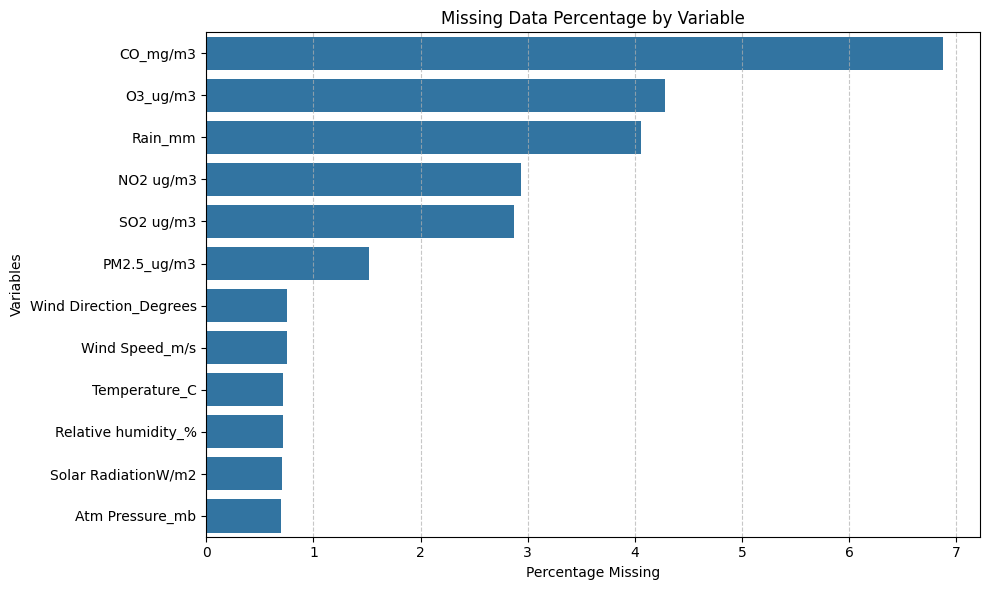

,Missing Count,% Missing
Temperature_C,63,0.717213
Rain_mm,356,4.052823
Solar RadiationW/m2,62,0.705829
Relative humidity_%,63,0.717213
Wind Speed_m/s,66,0.751366
Wind Direction_Degrees,66,0.751366
Atm Pressure_mb,61,0.694444
NO2 ug/m3,258,2.937158
SO2 ug/m3,252,2.868852
CO_mg/m3,604,6.876138


In [8]:
# ---------------------------
# 2. Bar Plot of Missing Values
# ---------------------------
import seaborn as sns
plt.figure(figsize=(10, 6))
missing_summary_sorted = missing_summary.sort_values('% Missing', ascending=False)
sns.barplot(x=missing_summary_sorted['% Missing'], y=missing_summary_sorted.index)
plt.xlabel("Percentage Missing")
plt.ylabel("Variables")
plt.title("Missing Data Percentage by Variable")
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

missing_summary

<h2>Raw visualization</h2>

In [9]:
# Separate pollutant groups
# ============================================================
pollutants_ug = ["NO2 ug/m3","SO2 ug/m3","O3_ug/m3","PM2.5_ug/m3"]
co_mg         = ["CO_mg/m3"]
all_pollutants = pollutants_ug + co_mg

# Weather features
weather = ['Temperature_C','Rain_mm','Solar RadiationW/m2',
           'Relative humidity_%','Wind Speed_m/s',
           'Wind Direction_Degrees','Atm Pressure_mb']


In [10]:
# 2. Visualize time series for pollutants and key meteorological features
pollutant_cols = all_pollutants + weather

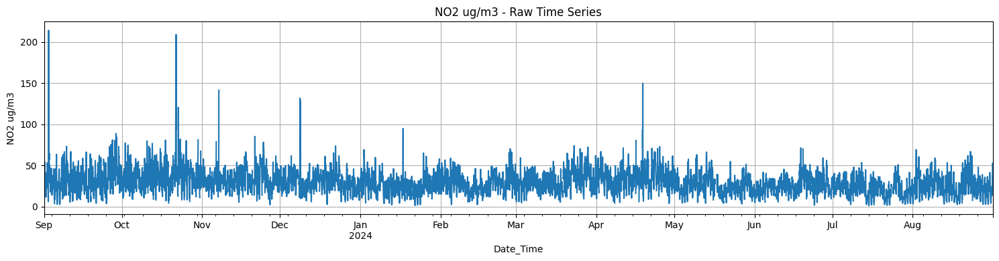

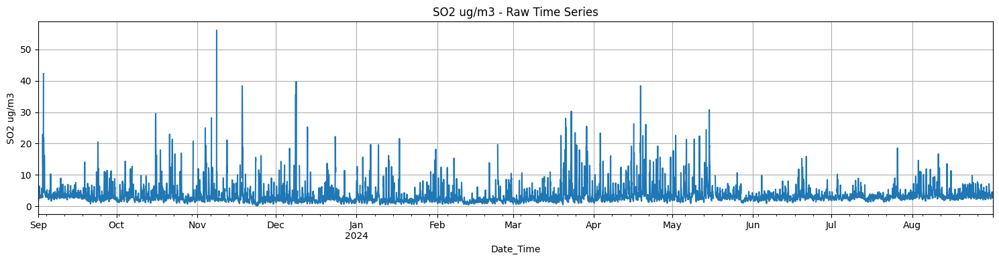

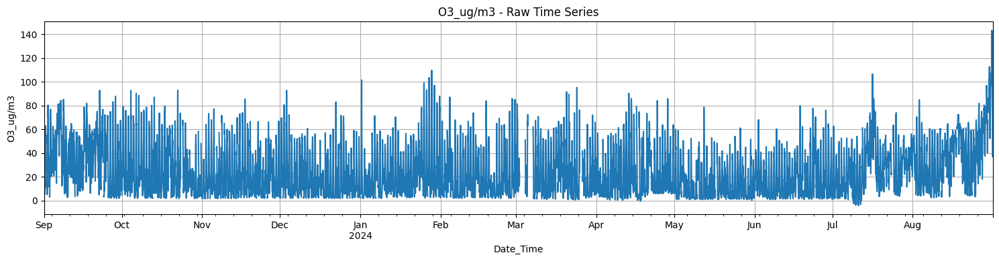

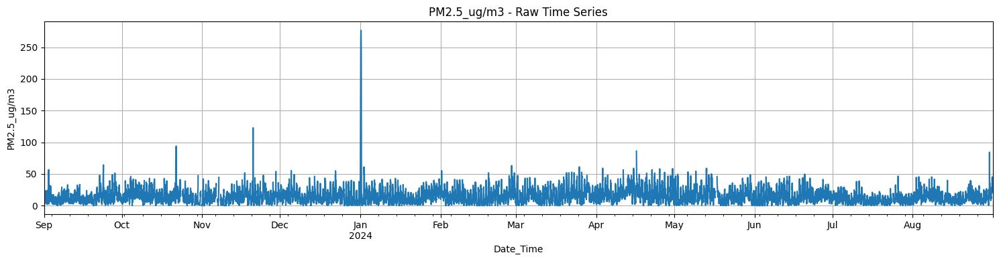

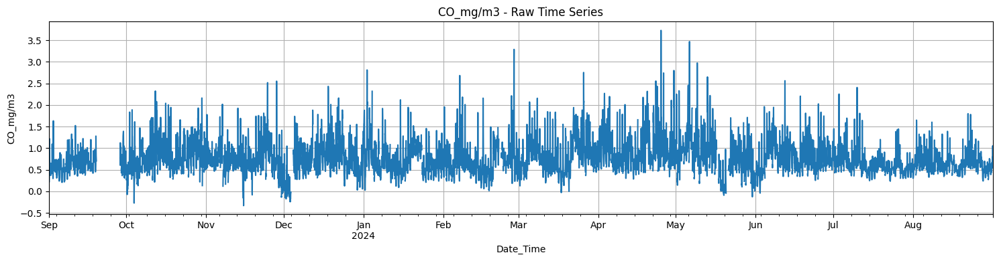

...

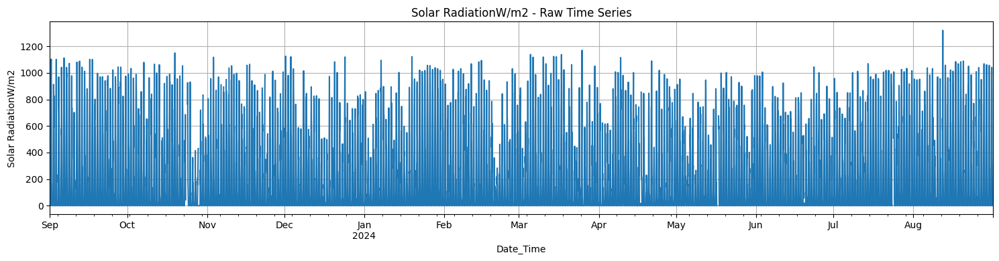

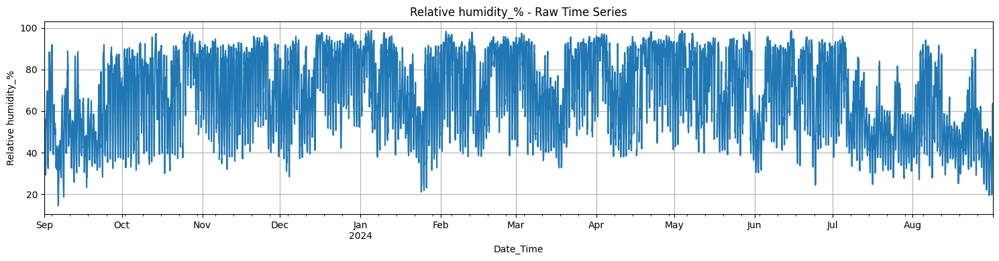

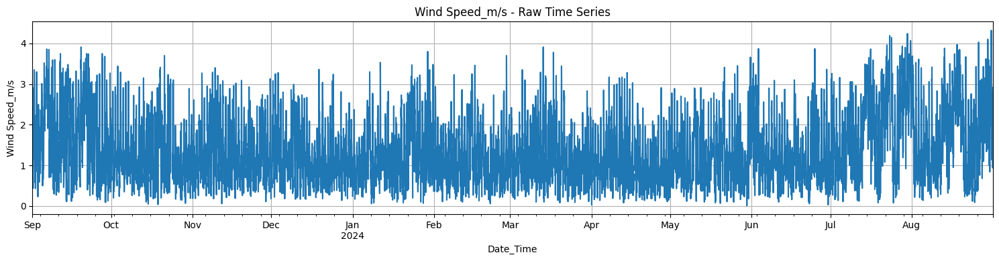

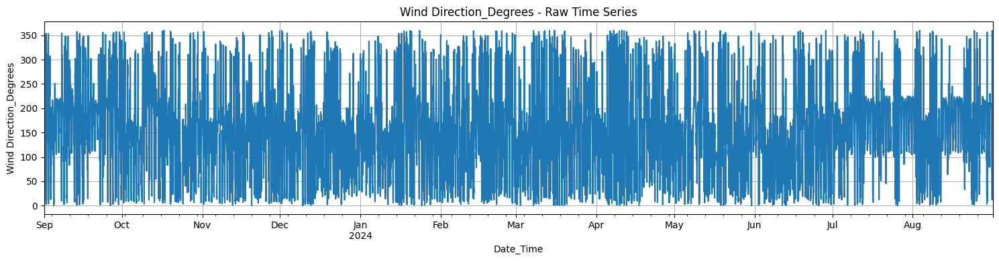

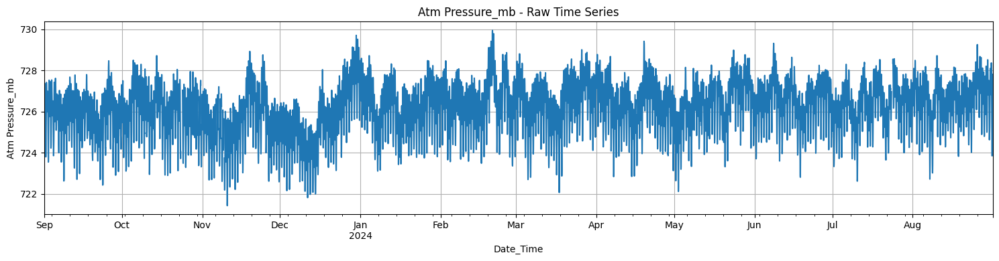

NO2 ug/m3                 float64
SO2 ug/m3                 float64
O3_ug/m3                  float64
PM2.5_ug/m3               float64
CO_mg/m3                  float64
Temperature_C             float64
Rain_mm                   float64
Solar RadiationW/m2       float64
Relative humidity_%       float64
Wind Speed_m/s            float64
Wind Direction_Degrees    float64
Atm Pressure_mb           float64
dtype: object

In [11]:
# Plotting
for col in pollutant_cols:
    plt.figure(figsize=(15, 4))
    df[col].plot()
    plt.title(f"{col} - Raw Time Series")
    plt.ylabel(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Check data types after conversion
df.dtypes[pollutant_cols]

<h2>Outlier detection and visualization</h2>

In [12]:
import numpy as np
from scipy.stats import zscore
# Detect outliers using Z-score threshold
outlier_mask = pd.DataFrame(index=df.index)

In [13]:
# We'll consider z-score > 3 as an outlier
zscore_threshold = 3

In [14]:
# Store outlier flags for pollutants
for col in pollutant_cols:
    zscores = np.abs(zscore(df[col].dropna()))
    outlier_series = pd.Series(False, index=df.index)
    outlier_series.loc[df[col].dropna().index] = zscores > zscore_threshold
    outlier_mask[col] = outlier_series
    

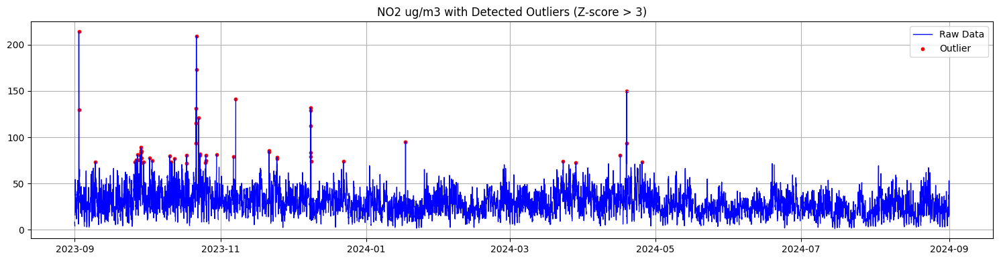

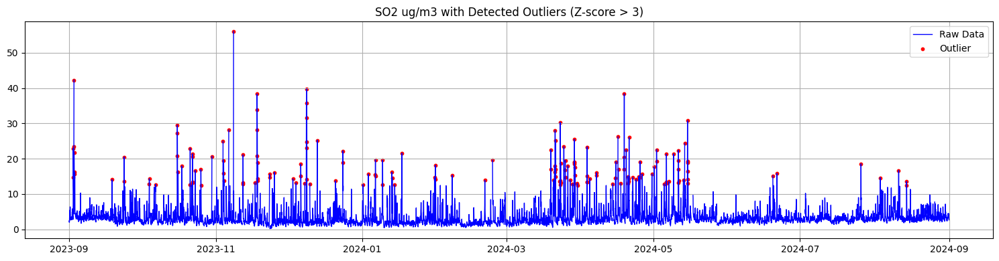

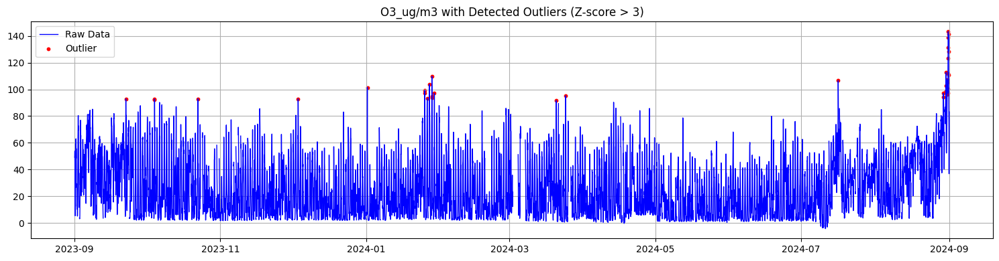

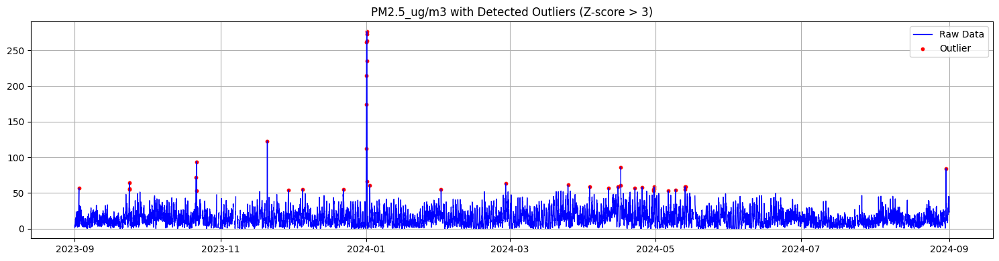

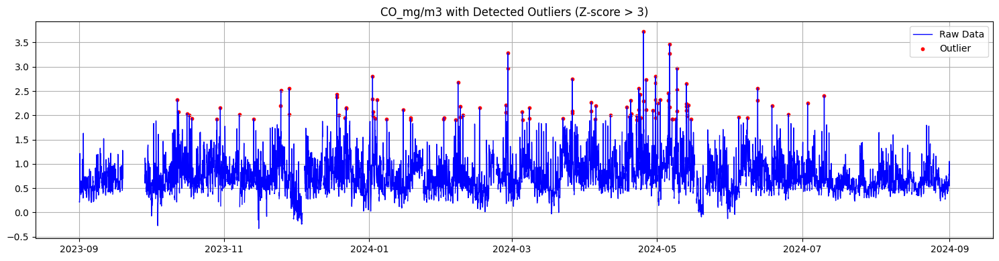

...

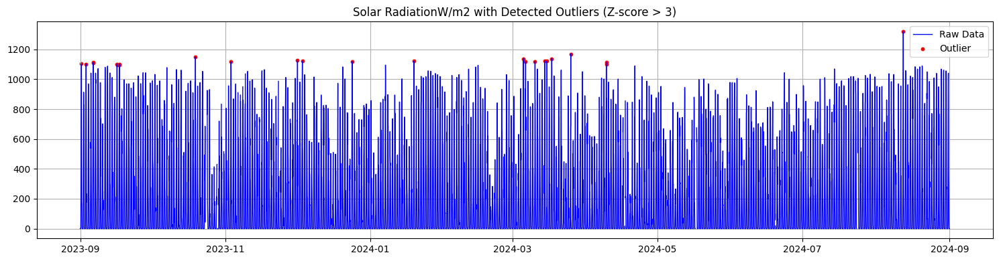

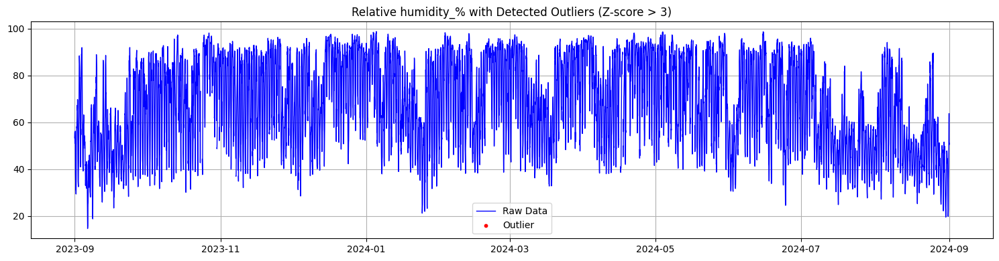

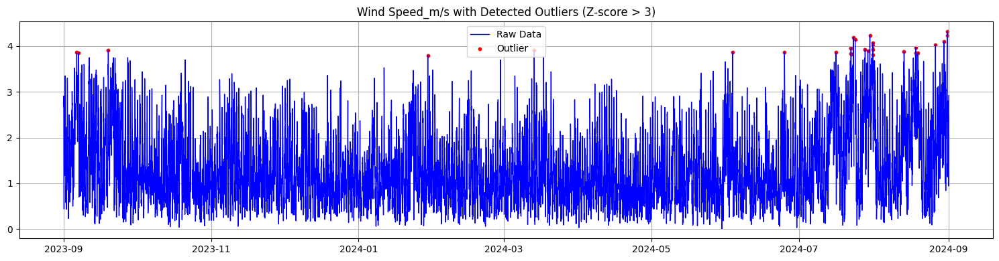

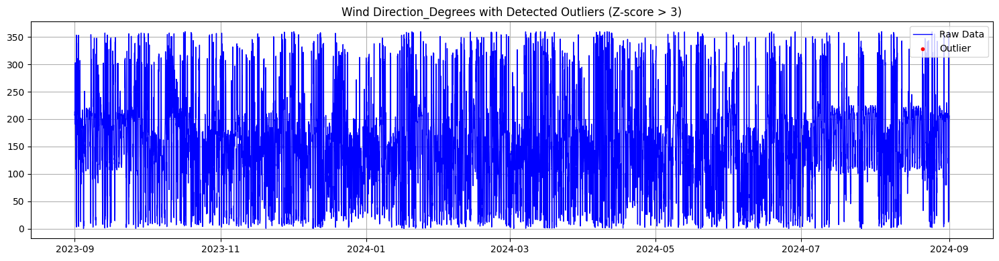

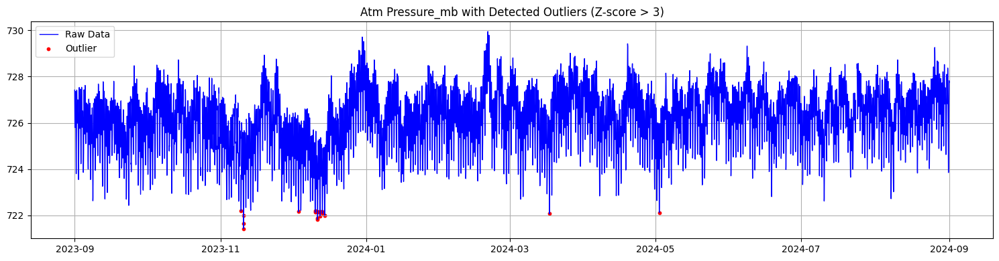

In [15]:
# Visualize outliers on top of original data
for col in pollutant_cols:
    plt.figure(figsize=(15, 4))
    plt.plot(df.index, df[col], label='Raw Data', color='blue', linewidth=1)
    plt.scatter(df.index[outlier_mask[col]], df[col][outlier_mask[col]],
                color='red', s=10, label='Outlier')
    plt.title(f"{col} with Detected Outliers (Z-score > {zscore_threshold})")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [16]:
# Report outlier percentages
outlier_percentage = (outlier_mask.sum() / len(df)) * 100
outlier_percentage

NO2 ug/m3                 0.637523
SO2 ug/m3                 1.935337
O3_ug/m3                  0.443989
PM2.5_ug/m3               0.466758
CO_mg/m3                  1.183971
Temperature_C             0.000000
Rain_mm                   1.331967
Solar RadiationW/m2       0.273224
Relative humidity_%       0.000000
Wind Speed_m/s            0.341530
Wind Direction_Degrees    0.000000
Atm Pressure_mb           0.227687
dtype: float64

<h2>Handling outlliers and missing value</h2>

<h2>Handling missing value</h2>

In [17]:
# 1. Interpolate weather (time-based)
df[weather] = df[weather].interpolate(method='time')

In [18]:
# === Step 2: STL Decomposition + Interpolation for Non-CO Pollutants ===
def stl_impute(series, period=24):
    s = series.copy()
    if s.isna().sum() == 0:
        return s
    s[s.isna()] = 0  # temporary zero-fill required by STL
    stl = STL(s, period=period, robust=True)
    result = stl.fit()
    return (result.seasonal + result.trend + result.resid).interpolate('linear')

for col in pollutants_ug:
    df[col] = stl_impute(df[col])

In [19]:
# === Step 2b: Interpolate CO Separately ===
df['CO_mg/m3'] = df['CO_mg/m3'].interpolate(method='time')  # or use STL if needed

In [20]:
# 3. KNN impute any remaining small gaps
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
df[df.columns] = imputer.fit_transform(df)

In [21]:
# === Final Check ===
print("✅ Any NaNs left?", df.isna().sum().sum())  # should be 0

✅ Any NaNs left? 0


<h2>outlier handling</h2>

In [22]:
df_1y_clean = df.copy()
print(f"📏 Using 1-year cleaned data ({df_1y_clean.index.min()} → {df_1y_clean.index.max()})")


📏 Using 1-year cleaned data (2023-09-01 00:00:00 → 2024-08-31 23:00:00)


In [23]:
# 1) clip negatives to 0 for pollutants (physically meaningful)
for col in pollutants_ug + co_mg:
    if col in df_1y_clean.columns:
        df_1y_clean[col] = df_1y_clean[col].clip(lower=0)

In [24]:
# 2) winsorize (distribution-aware clipping) at 1%–99% within the 3-year window
for col in pollutants_ug + co_mg:
    if col in df_1y_clean.columns:
        lo, hi = df_1y_clean[col].quantile([0.01, 0.99])
        df_1y_clean[col] = df_1y_clean[col].clip(lower=lo, upper=hi)


In [25]:
# 3) optional: cap by conservative physical/operational limits to kill rare spikes
limits = {
    'NO2 ug/m3'   : 300,
    'SO2 ug/m3'   : 300,
    'O3_ug/m3'    : 300,
    'PM2.5_ug/m3' : 800,
    'CO_mg/m3'    : 20
}
for col, lim in limits.items():
    if col in df_1y_clean.columns:
        df_1y_clean[col] = df_1y_clean[col].clip(upper=lim)

In [26]:
# 6) Sanity check
# ------------------------------------------------------------
print("✅ Outlier handling complete.")
print("Remaining NaNs:", df_1y_clean.isna().sum().sum())


✅ Outlier handling complete.
Remaining NaNs: 0


<Figure size 2000x800 with 0 Axes>

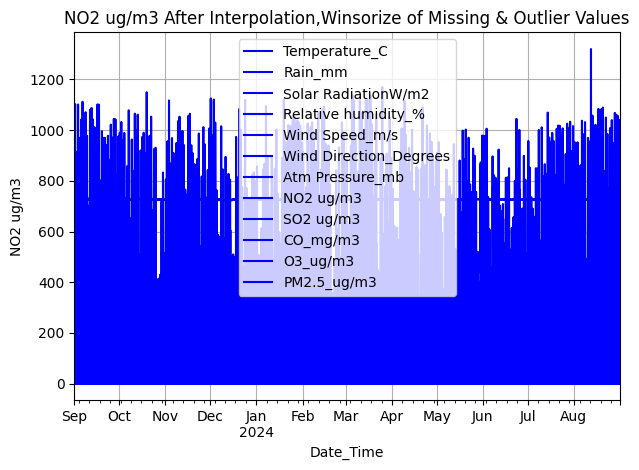

<Figure size 2000x800 with 0 Axes>

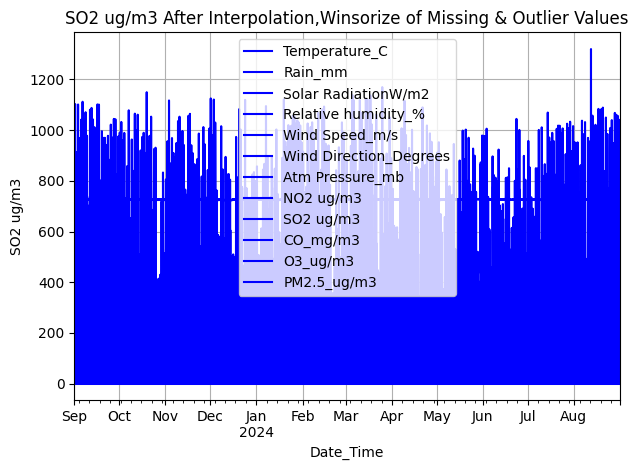

<Figure size 2000x800 with 0 Axes>

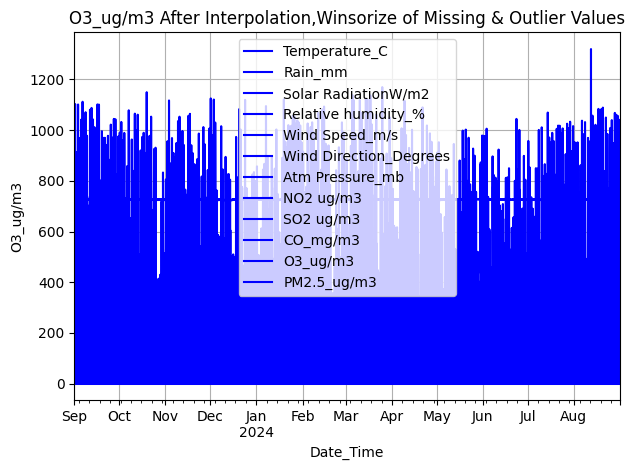

<Figure size 2000x800 with 0 Axes>

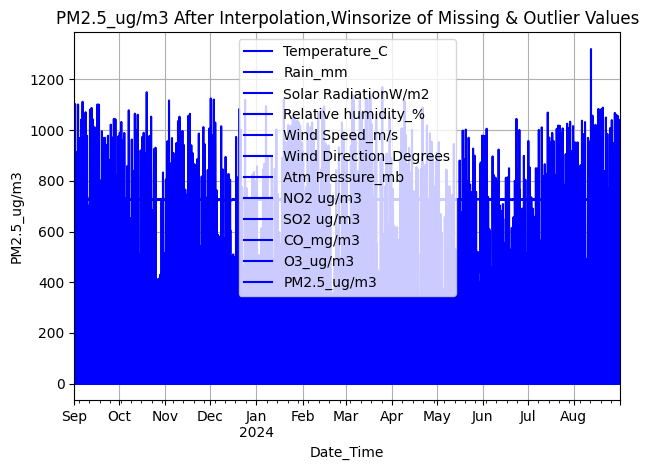

<Figure size 2000x800 with 0 Axes>

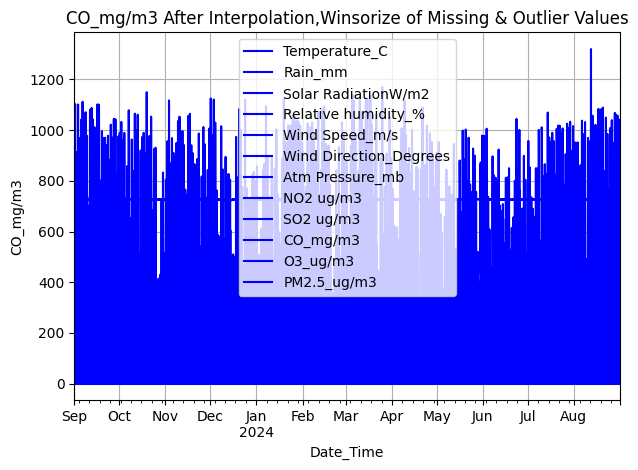

<Figure size 2000x800 with 0 Axes>

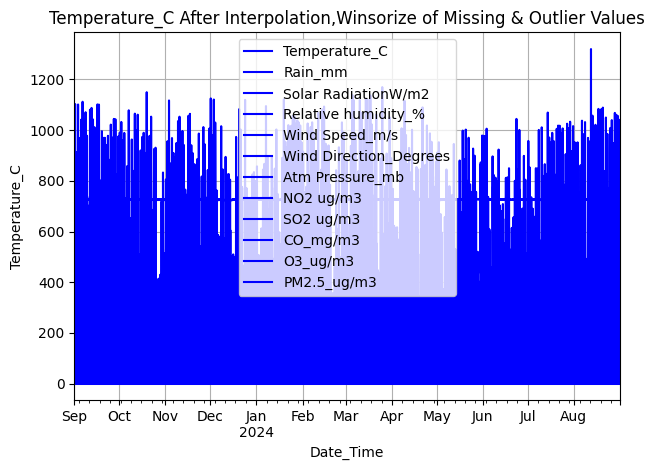

<Figure size 2000x800 with 0 Axes>

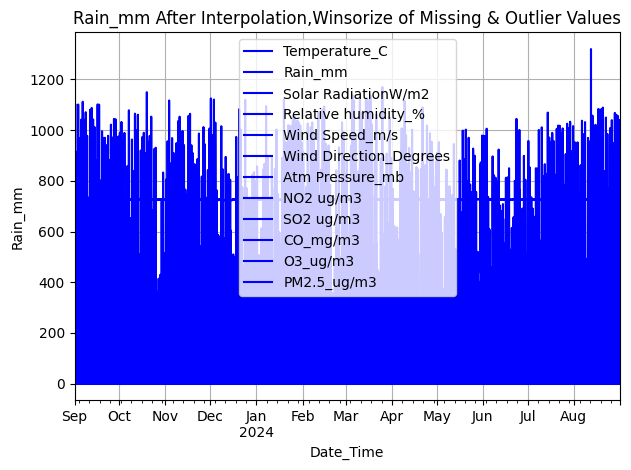

<Figure size 2000x800 with 0 Axes>

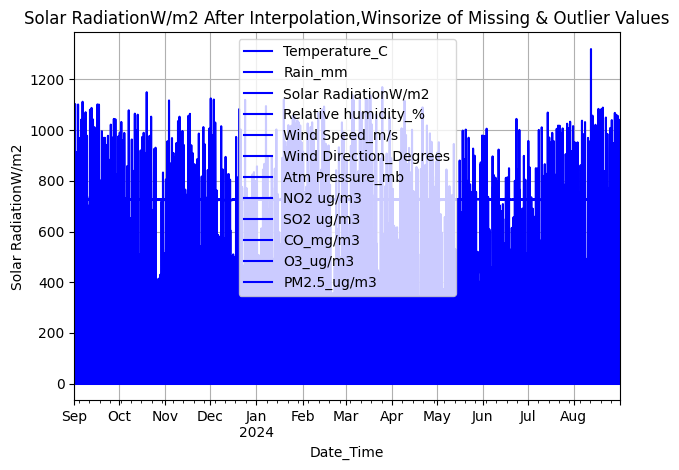

<Figure size 2000x800 with 0 Axes>

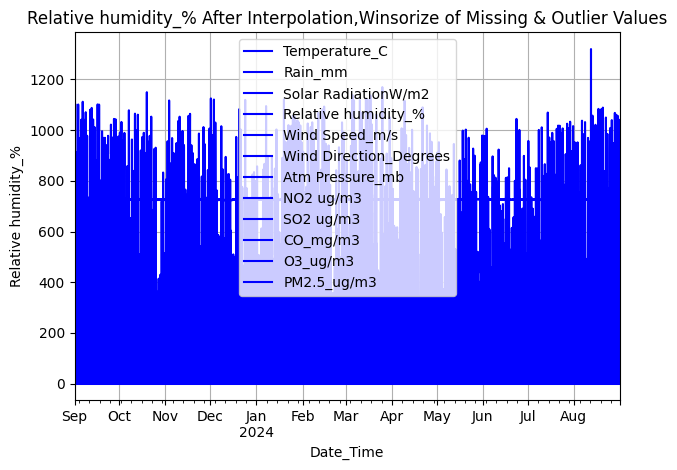

<Figure size 2000x800 with 0 Axes>

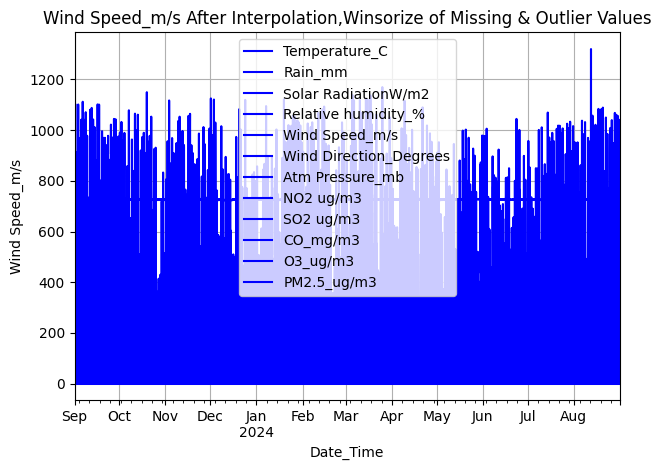

<Figure size 2000x800 with 0 Axes>

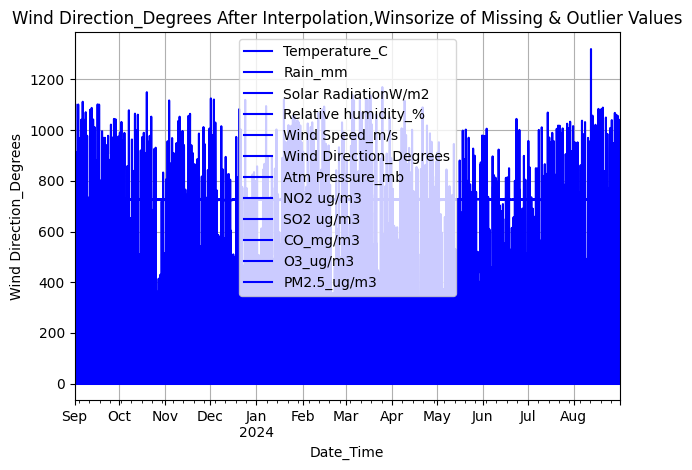

<Figure size 2000x800 with 0 Axes>

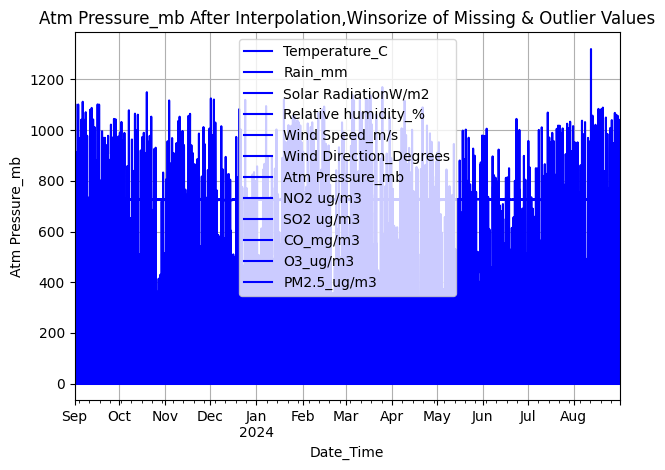

In [27]:
# Visualize post-interpolation results
for col in pollutant_cols:
    plt.figure(figsize=(20, 8))
    df_1y_clean.plot(label='Interpolated Data', color='blue')
    plt.title(f"{col} After Interpolation,Winsorize of Missing & Outlier Values")
    plt.ylabel(col)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [28]:
# Report remaining missing values
remaining_missing = df_1y_clean[pollutant_cols].isna().sum()
remaining_missing

NO2 ug/m3                 0
SO2 ug/m3                 0
O3_ug/m3                  0
PM2.5_ug/m3               0
CO_mg/m3                  0
Temperature_C             0
Rain_mm                   0
Solar RadiationW/m2       0
Relative humidity_%       0
Wind Speed_m/s            0
Wind Direction_Degrees    0
Atm Pressure_mb           0
dtype: int64

<h2>ADF sttuibarity tests</h2>

In [29]:
from statsmodels.tsa.stattools import adfuller

# Stage 5: Stationarity Check using Augmented Dickey-Fuller (ADF) Test

def adf_test(series, name):
    """Run ADF test and print results."""
    result = adfuller(series.dropna(), autolag='AIC')
    test_stat, p_value, lags, n_obs, crit_vals, _ = result
    print(f"\n{name}")
    print("-" * len(name))
    print(f"ADF Statistic : {test_stat:.4f}")
    print(f"p-value       : {p_value:.4f}")
    print("Critical Values:")
    for key, val in crit_vals.items():
        print(f"   {key}: {val:.4f}")
    print(f"Result        : {'Stationary ✅' if p_value < 0.05 else 'Non-Stationary ❌'}")

In [30]:
# Run ADF test on all pollutants
for col in pollutant_cols:
    adf_test(df_1y_clean[col], col)


NO2 ug/m3
---------
ADF Statistic : -8.7879
p-value       : 0.0000
Critical Values:
   1%: -3.4311
   5%: -2.8619
   10%: -2.5669
Result        : Stationary ✅

SO2 ug/m3
---------
ADF Statistic : -12.8768
p-value       : 0.0000
Critical Values:
   1%: -3.4311
   5%: -2.8619
   10%: -2.5669
Result        : Stationary ✅

O3_ug/m3
--------
ADF Statistic : -6.7048
p-value       : 0.0000
Critical Values:
   1%: -3.4311
   5%: -2.8619
   10%: -2.5669
Result        : Stationary ✅

PM2.5_ug/m3
-----------
ADF Statistic : -10.2519
p-value       : 0.0000
Critical Values:
   1%: -3.4311
   5%: -2.8619
   10%: -2.5669
Result        : Stationary ✅

CO_mg/m3
--------
ADF Statistic : -8.7656
p-value       : 0.0000
Critical Values:
   1%: -3.4311
   5%: -2.8619
   10%: -2.5669
Result        : Stationary ✅

Temperature_C
-------------
ADF Statistic : -9.8211
p-value       : 0.0000
Critical Values:
   1%: -3.4311
   5%: -2.8619
   10%: -2.5669
Result        : Stationary ✅

Rain_mm
-------
ADF Statistic

<h2>Seasonal decomposition</h2>

In [31]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Stage 7 Part 1: Seasonal Decomposition for pollutants
# Use 'additive' model with daily seasonality (24h)
period = 24  # daily cycle for hourly data

<Figure size 1200x800 with 0 Axes>

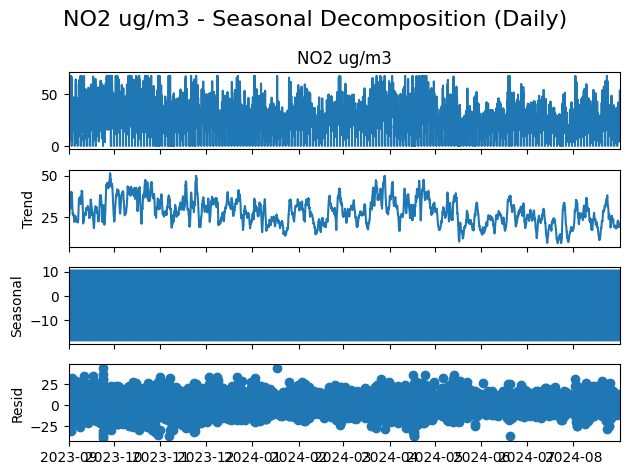

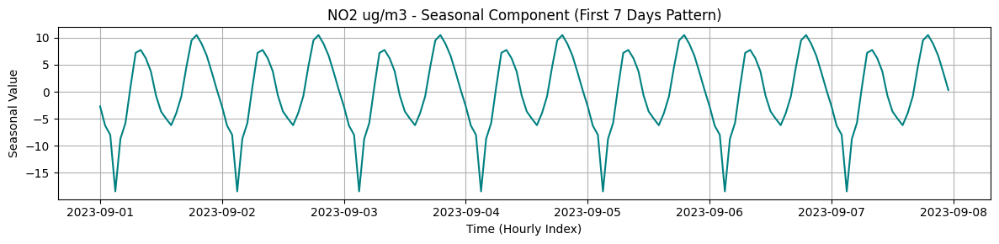

<Figure size 1200x800 with 0 Axes>

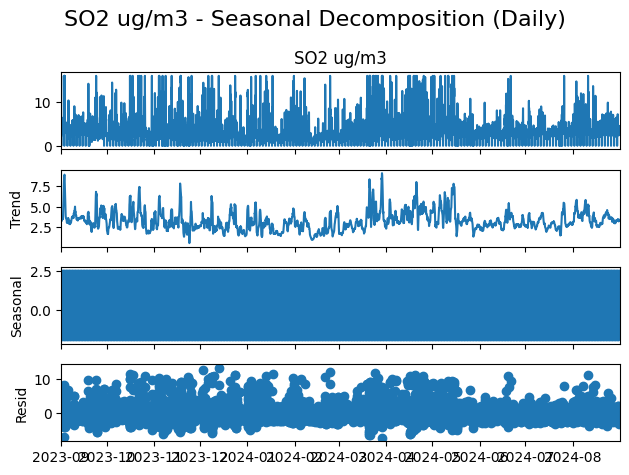

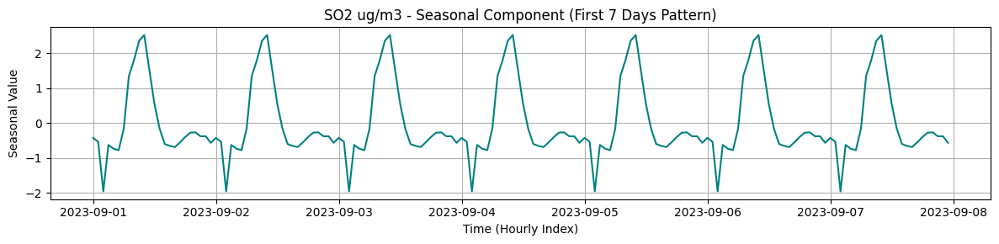

<Figure size 1200x800 with 0 Axes>

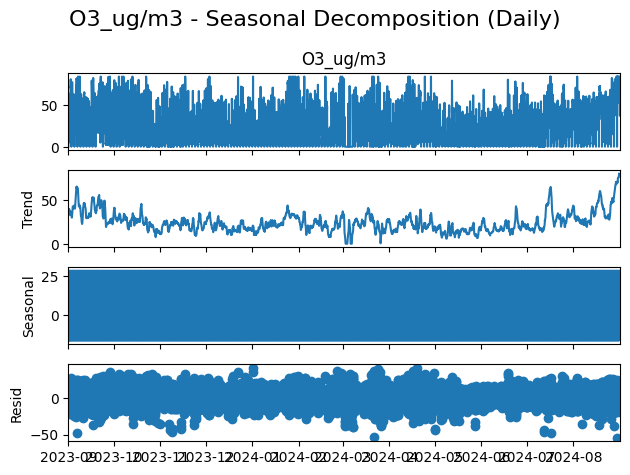

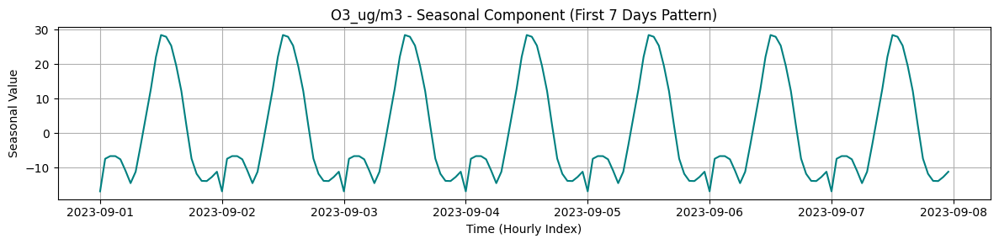

<Figure size 1200x800 with 0 Axes>

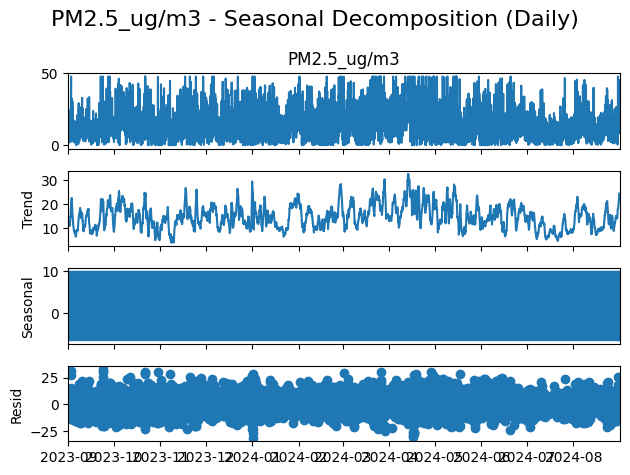

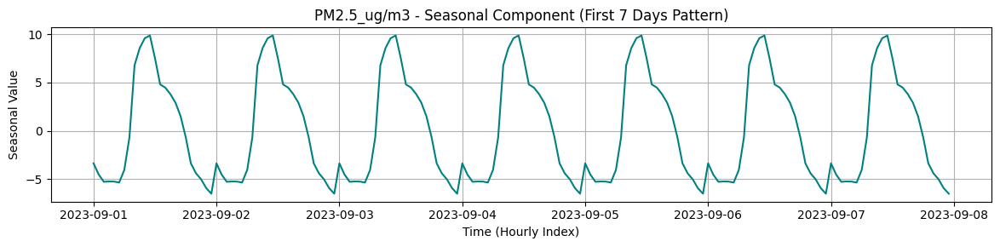

<Figure size 1200x800 with 0 Axes>

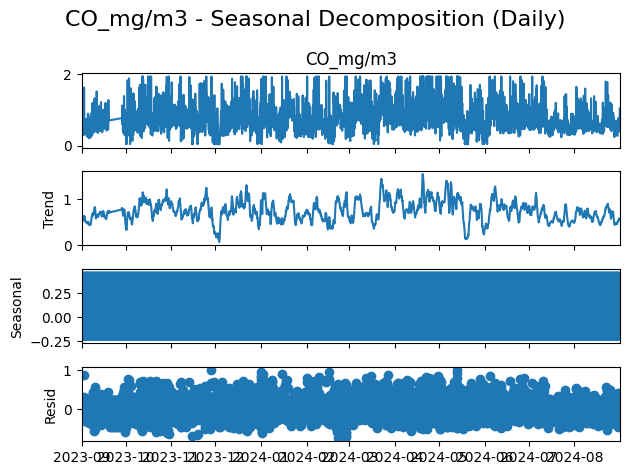

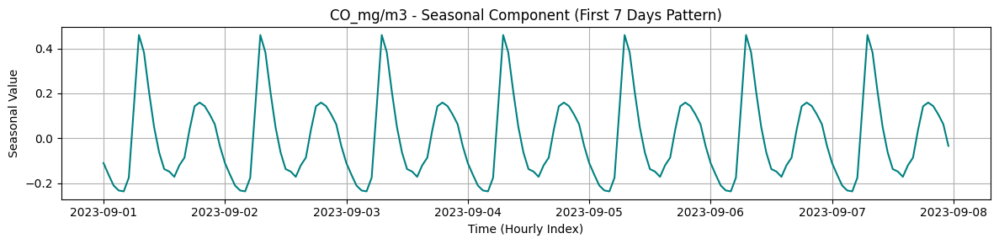

<Figure size 1200x800 with 0 Axes>

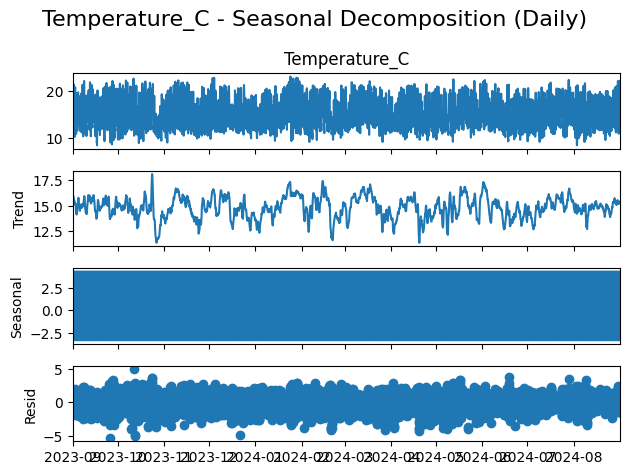

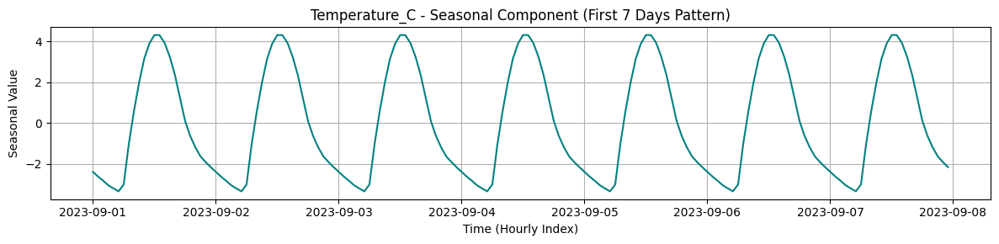

<Figure size 1200x800 with 0 Axes>

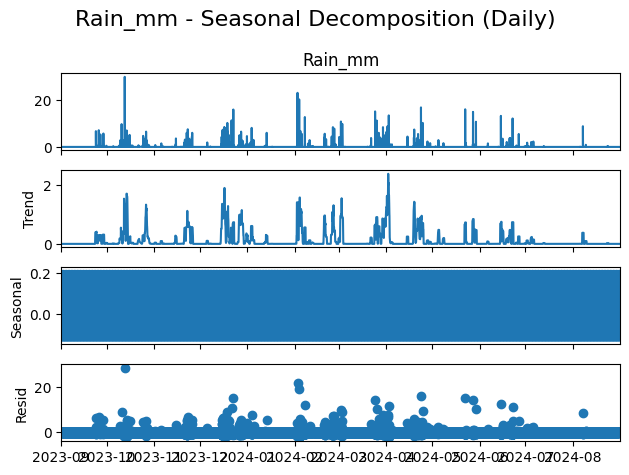

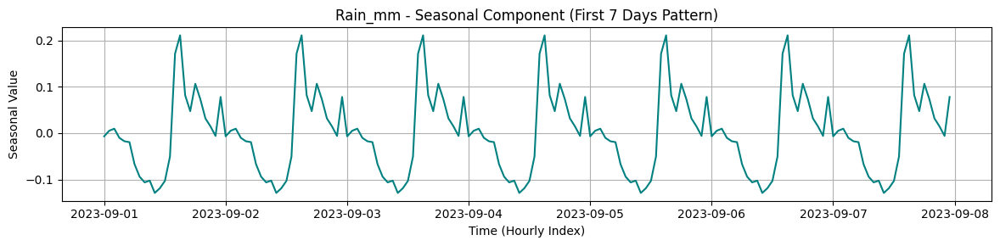

<Figure size 1200x800 with 0 Axes>

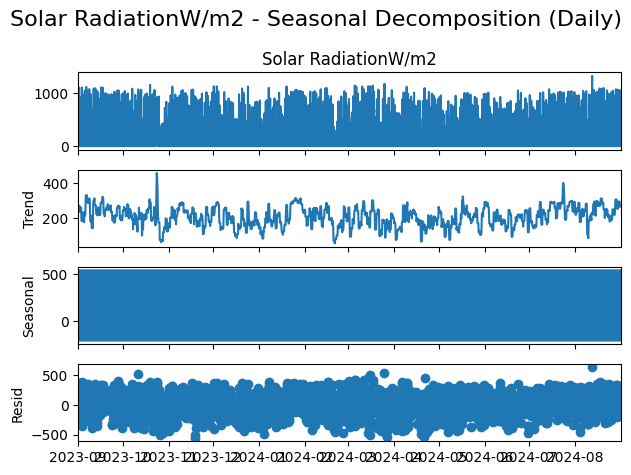

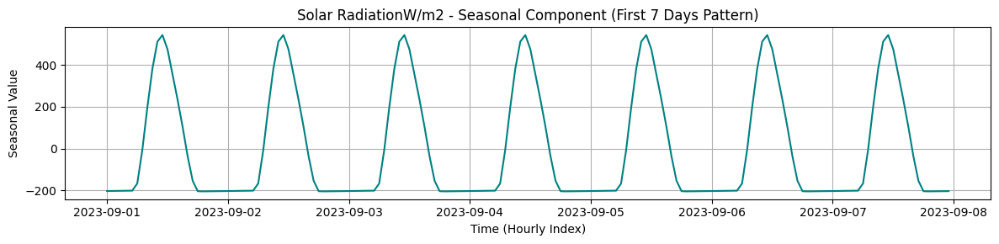

<Figure size 1200x800 with 0 Axes>

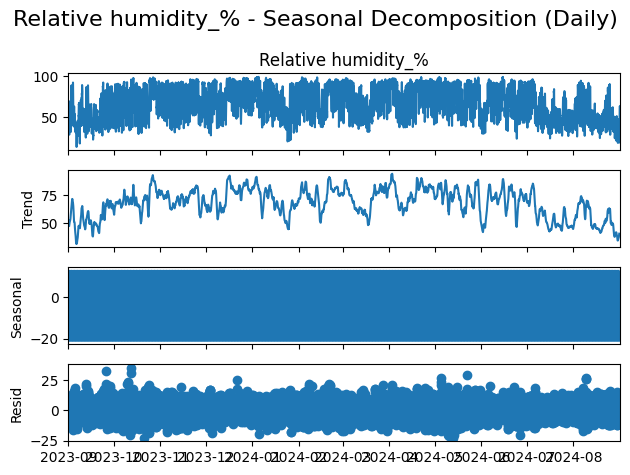

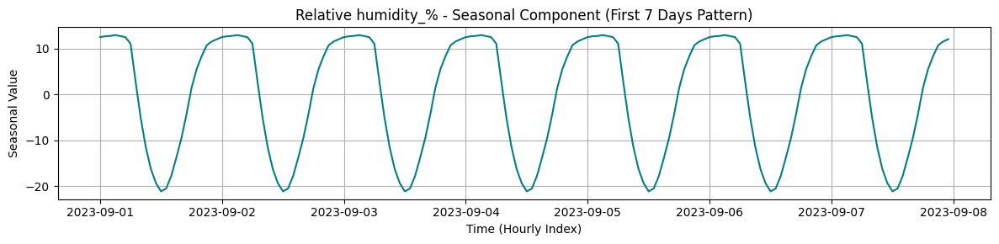

<Figure size 1200x800 with 0 Axes>

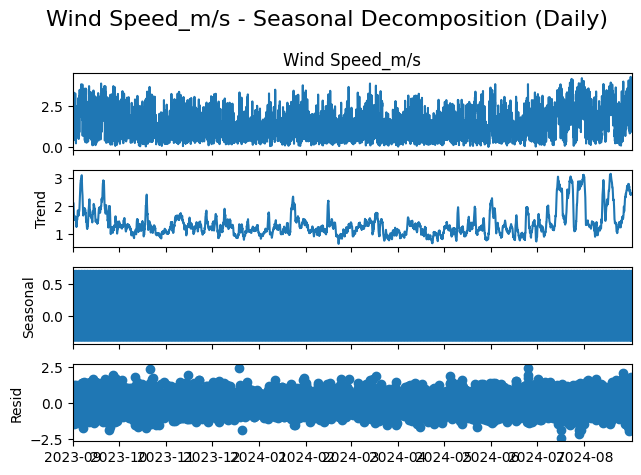

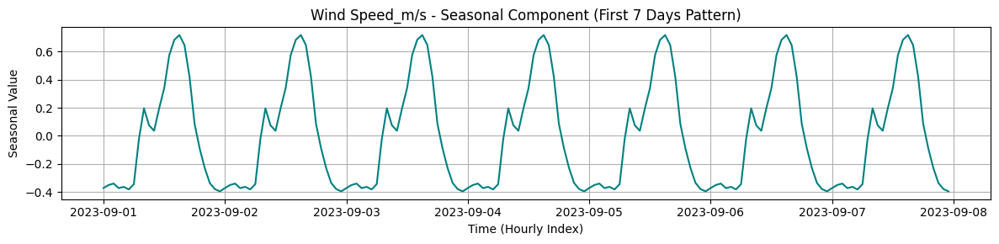

<Figure size 1200x800 with 0 Axes>

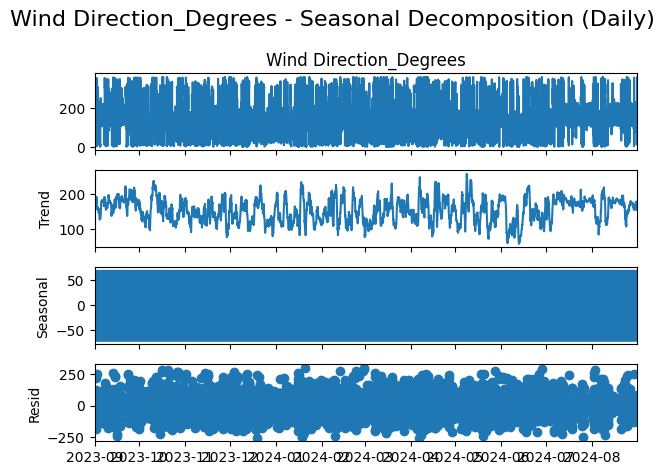

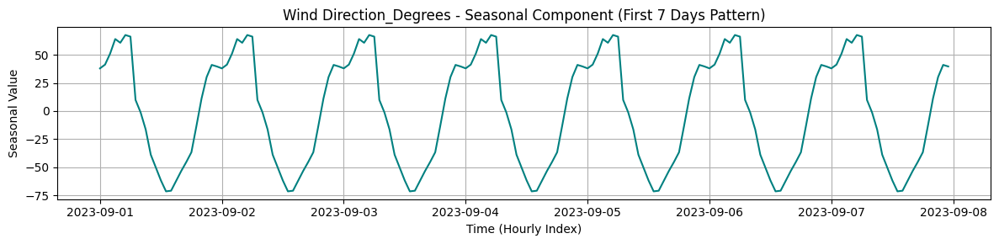

<Figure size 1200x800 with 0 Axes>

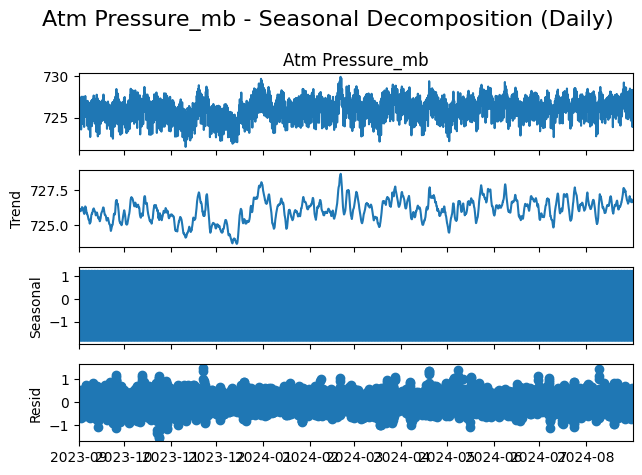

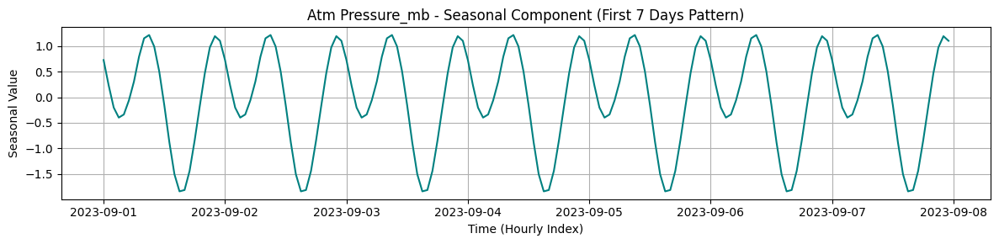

In [32]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

# Define the seasonal period (24 hours for daily seasonality)
period = 24

# Loop through all pollutants
for col in pollutant_cols:
    try:
        # Perform seasonal decomposition
        result = seasonal_decompose(df_1y_clean[col], model='additive', period=period)

        # Plot full decomposition
        plt.figure(figsize=(12, 8))
        result.plot()
        plt.suptitle(f"{col} - Seasonal Decomposition (Daily)", fontsize=16)
        plt.tight_layout()
        plt.show()

        # Extract seasonal component and plot 7 days (168 hours)
        seasonal = result.seasonal
        seasonal_subset = seasonal[:24*7]  # First 7 days

        plt.figure(figsize=(12, 3))
        plt.plot(seasonal_subset, color='teal')
        plt.title(f"{col} - Seasonal Component (First 7 Days Pattern)")
        plt.ylabel("Seasonal Value")
        plt.xlabel("Time (Hourly Index)")
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"Decomposition failed for {col}: {e}")


<h2>Feature Engineering</h2>

In [36]:
import numpy as np
import pandas as pd

# assumes df already exists and is indexed by Date_Time
df_feat = df.copy()

# --- time components ---
df_feat["hour"] = df_feat.index.hour
df_feat["dow"]  = df_feat.index.dayofweek
df_feat["month"] = df_feat.index.month
df_feat["doy"] = df_feat.index.dayofyear

# --- cyclic time encodings ---
df_feat["hour_sin"] = np.sin(2*np.pi*df_feat["hour"]/24)
df_feat["hour_cos"] = np.cos(2*np.pi*df_feat["hour"]/24)

df_feat["dow_sin"]  = np.sin(2*np.pi*df_feat["dow"]/7)
df_feat["dow_cos"]  = np.cos(2*np.pi*df_feat["dow"]/7)

df_feat["doy_sin"]  = np.sin(2*np.pi*df_feat["doy"]/365.25)
df_feat["doy_cos"]  = np.cos(2*np.pi*df_feat["doy"]/365.25)

# --- wind direction cyclic encoding ---
# (only if wind direction exists)
if "Wind Direction_Degrees" in df_feat.columns:
    rad = np.deg2rad(df_feat["Wind Direction_Degrees"])
    df_feat["wd_sin"] = np.sin(rad)
    df_feat["wd_cos"] = np.cos(rad)
else:
    df_feat["wd_sin"] = np.nan
    df_feat["wd_cos"] = np.nan

# Optional: wind vector components (often more useful than raw direction)
if ("Wind Speed_m/s" in df_feat.columns) and ("wd_sin" in df_feat.columns):
    df_feat["wind_u"] = df_feat["Wind Speed_m/s"] * df_feat["wd_cos"]
    df_feat["wind_v"] = df_feat["Wind Speed_m/s"] * df_feat["wd_sin"]


In [38]:
# use your existing lists from the notebook
targets = all_pollutants  # = pollutants_ug + co_mg

def add_lags(df_in: pd.DataFrame, cols, lags):
    out = df_in.copy()
    for c in cols:
        if c not in out.columns:
            continue
        for L in lags:
            out[f"{c}_lag{L}"] = out[c].shift(L)
    return out

def add_roll_stats(df_in: pd.DataFrame, cols, windows):
    """
    Past-only rolling stats:
    shift(1) prevents using the current hour's value to build features for that same hour.
    """
    out = df_in.copy()
    for c in cols:
        if c not in out.columns:
            continue
        for w in windows:
            out[f"{c}_roll{w}_mean"] = out[c].shift(1).rolling(w).mean()
            out[f"{c}_roll{w}_std"]  = out[c].shift(1).rolling(w).std()
    return out

# Recommended lags for 72h horizon
LAGS = (1,2,3,6,12,24,48,72)

df_feat_lagged = add_lags(df_feat, targets, LAGS)
df_feat_lagged = add_roll_stats(df_feat_lagged, targets, windows=(24,72))

# OPTIONAL: meteorology lags (helps GBM/Hybrid)
met_for_lags = ["Temperature_C", "Relative humidity_%", "Atm Pressure_mb", "Wind Speed_m/s", "Solar RadiationW/m2", "Rain_mm"]
met_for_lags = [c for c in met_for_lags if c in df_feat_lagged.columns]
df_feat_lagged = add_lags(df_feat_lagged, met_for_lags, lags=(1,3,6,12,24))
df_feat_lagged = add_roll_stats(df_feat_lagged, met_for_lags, windows=(24,))

print("df_feat_lagged shape:", df_feat_lagged.shape)


df_feat_lagged shape: (8784, 128)


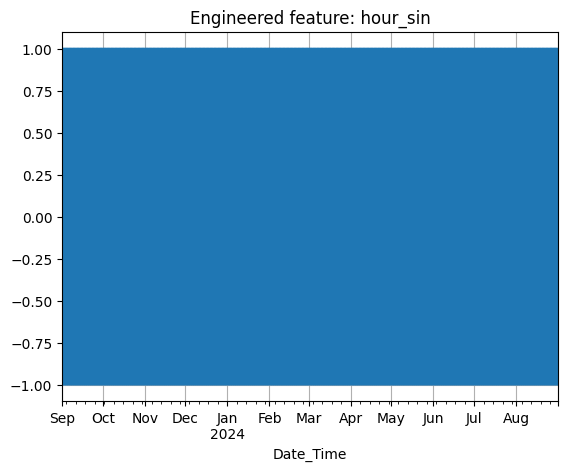

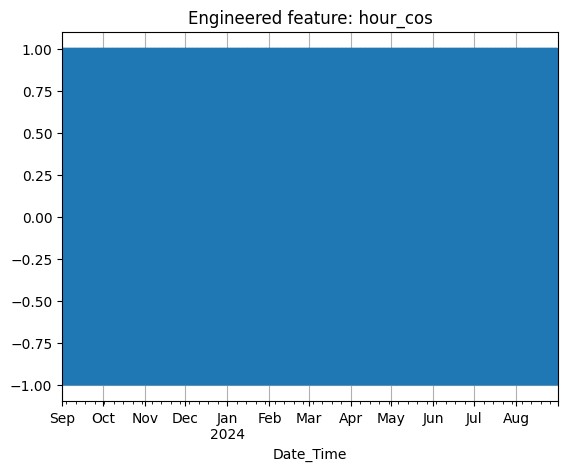

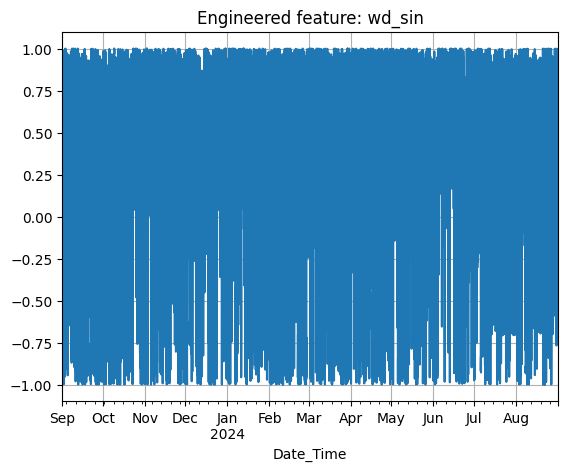

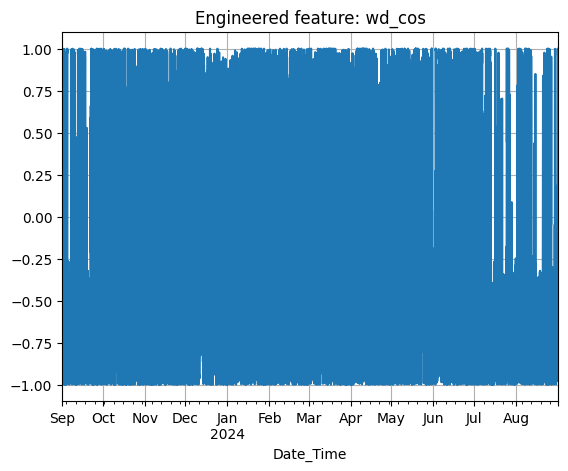

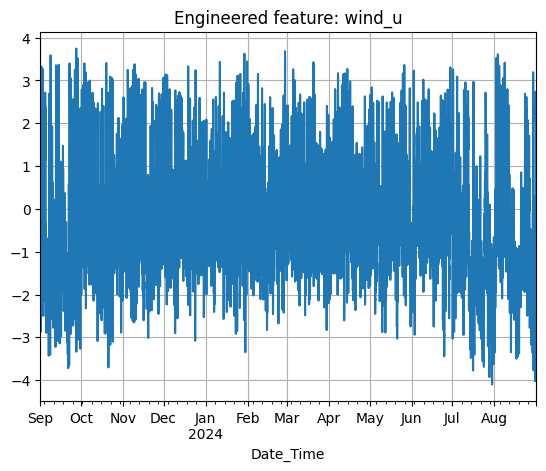

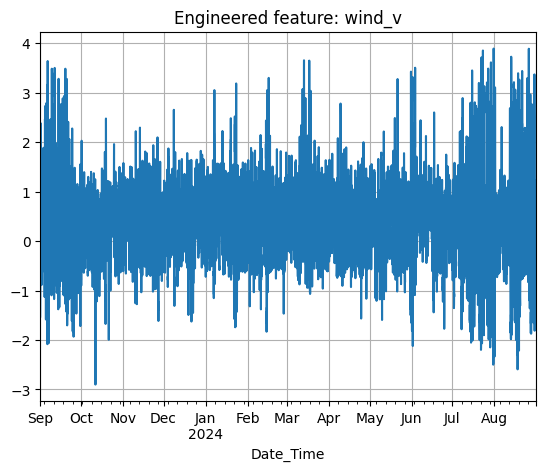

Example lag cols present: {'NO2 ug/m3_lag1': True, 'NO2 ug/m3_lag24': True, 'NO2 ug/m3_lag72': True}


In [39]:
import matplotlib.pyplot as plt

# show a few engineered columns
for c in ["hour_sin","hour_cos","wd_sin","wd_cos","wind_u","wind_v"]:
    if c in df_feat_lagged.columns:
        plt.figure()
        df_feat_lagged[c].plot()
        plt.title(f"Engineered feature: {c}")
        plt.grid(True)
        plt.show()

# sanity: lag columns exist
example = targets[0]
lag_cols = [f"{example}_lag1", f"{example}_lag24", f"{example}_lag72"]
print("Example lag cols present:", {c: (c in df_feat_lagged.columns) for c in lag_cols})


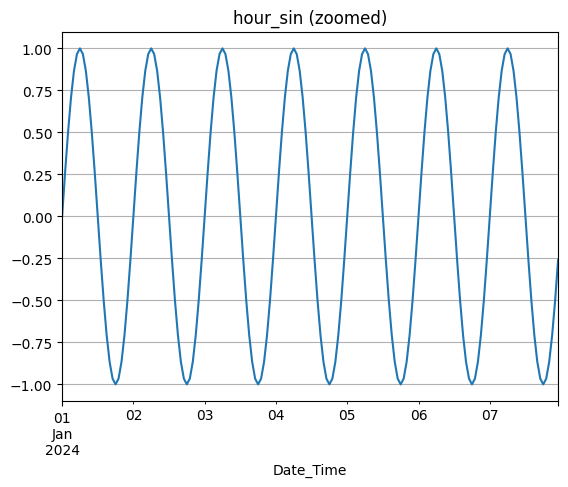

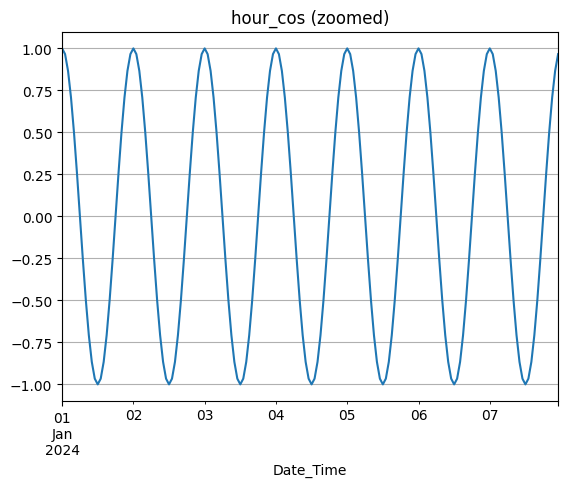

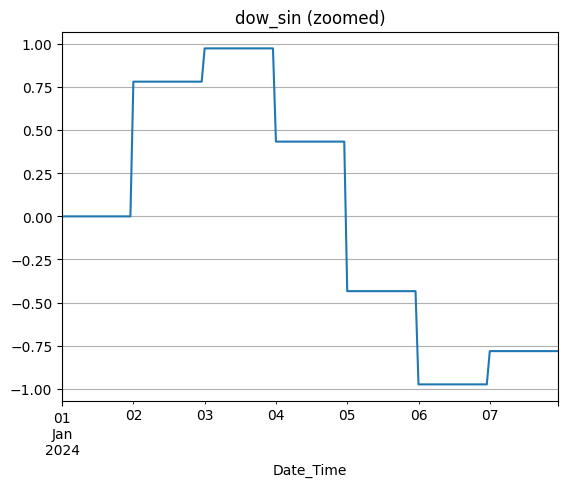

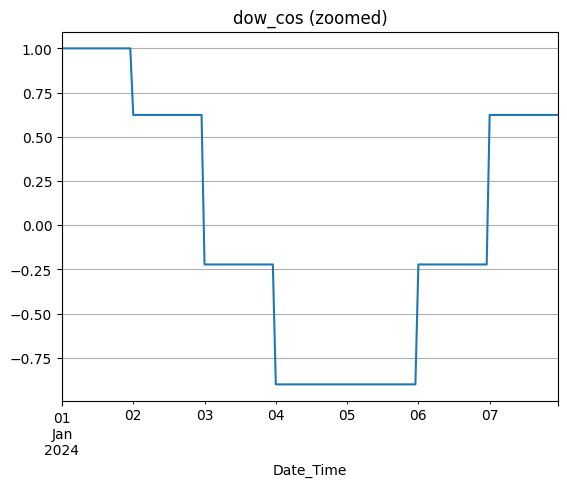

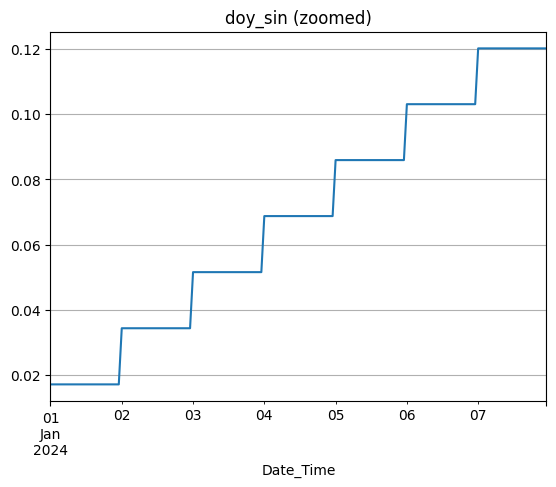

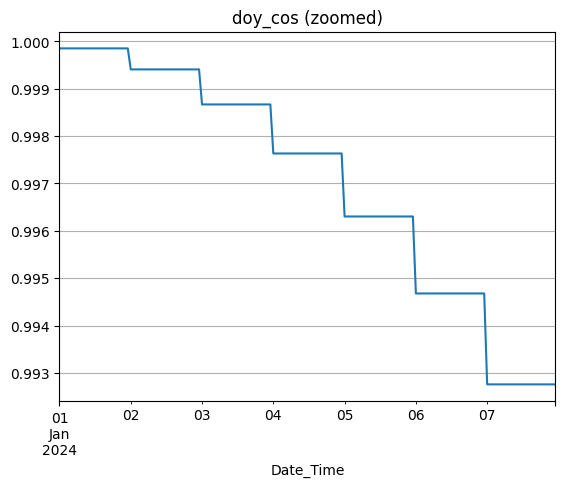

In [40]:
zoom_start = "2024-01-01"
zoom_end   = "2024-01-07"

for c in ["hour_sin","hour_cos","dow_sin","dow_cos","doy_sin","doy_cos"]:
    if c in df_feat_lagged.columns:
        plt.figure()
        df_feat_lagged.loc[zoom_start:zoom_end, c].plot()
        plt.title(f"{c} (zoomed)")
        plt.grid(True)
        plt.show()


In [41]:
# Display resulting dataframe shape and sample
df_feat.shape, df_fe.dropna().head(3)

((8784, 26),
                      Temperature_C  Rain_mm  Solar RadiationW/m2  \
 Date_Time                                                          
 2023-09-01 00:00:00          13.06      0.0                  0.0   
 2023-09-01 01:00:00          12.75      0.0                  0.0   
 2023-09-01 02:00:00          12.42      0.0                  0.0   
 
                      Relative humidity_%  Wind Speed_m/s  \
 Date_Time                                                  
 2023-09-01 00:00:00                53.28            2.79   
 2023-09-01 01:00:00                54.73            2.67   
 2023-09-01 02:00:00                55.79            2.85   
 
                      Wind Direction_Degrees  Atm Pressure_mb  NO2 ug/m3  \
 Date_Time                                                                 
 2023-09-01 00:00:00                  213.15           727.42       8.23   
 2023-09-01 01:00:00                  206.69           727.00       5.53   
 2023-09-01 02:00:00         

In [42]:
err_hour = (df_feat_lagged["hour_sin"]**2 + df_feat_lagged["hour_cos"]**2 - 1).abs().describe()
print("hour_sin/cos unit-circle error:\n", err_hour)

err_wd = (df_feat_lagged["wd_sin"]**2 + df_feat_lagged["wd_cos"]**2 - 1).abs().describe()
print("wd_sin/cos unit-circle error:\n", err_wd)


hour_sin/cos unit-circle error:
 count    8.784000e+03
mean     1.387779e-17
std      4.873996e-17
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.220446e-16
dtype: float64
wd_sin/cos unit-circle error:
 count    8.784000e+03
mean     3.183802e-17
std      6.201738e-17
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.220446e-16
dtype: float64


In [44]:
t = pollutant_cols[0]
check = (df_feat_lagged[t].shift(1) - df_feat_lagged[f"{t}_lag1"]).abs()
print("Max mismatch (should be 0 ignoring NaNs):", check.dropna().max())


Max mismatch (should be 0 ignoring NaNs): 0.0


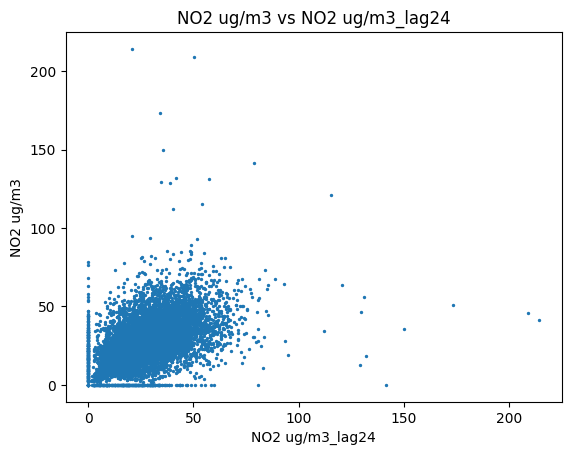

In [45]:
t = pollutant_cols[0]
plt.figure()
plt.scatter(df_feat_lagged[f"{t}_lag24"], df_feat_lagged[t], s=2)
plt.title(f"{t} vs {t}_lag24")
plt.xlabel(f"{t}_lag24")
plt.ylabel(t)
plt.show()


In [47]:
import os

OUT_DIR = r"C:/Users/User/OneDrive/Desktop/thesis/new_results"
os.makedirs(OUT_DIR, exist_ok=True)

clean_path_csv = os.path.join(OUT_DIR, "clean_preprocessed_data.csv")
df_1y_clean.to_csv(clean_path_csv, index=True)

print("Saved cleaned dataset (df_final) to:", clean_path_csv)
print("Shape:", df_1y_clean.shape)


Saved cleaned dataset (df_final) to: C:/Users/User/OneDrive/Desktop/thesis/new_results\clean_preprocessed_data.csv
Shape: (8784, 12)


In [48]:
import pandas as pd

# Load the cleaned and feature-engineered dataset (based on user preprocessing steps)
file_path = (r"C:/Users/User/OneDrive/Desktop/thesis/new_results/clean_preprocessed_data.csv")
df_raw = pd.read_csv(file_path)

# Parse datetime and set index
df_raw['Date_Time'] = pd.to_datetime(df_raw['Date_Time'], errors='coerce')
df_raw.set_index('Date_Time', inplace=True)

# Select the 1-year window
df_1y = df_raw.loc["2023-09-01":"2024-08-31"].copy()

# Convert all columns to numeric
df_1y = df_1y.apply(pd.to_numeric, errors='coerce')

# Define pollutant columns as per previous context
pollutants_ug = ["NO2 ug/m3", "SO2 ug/m3", "O3_ug/m3", "PM2.5_ug/m3"]
co_mg = ["CO_mg/m3"]
pollutant_cols = pollutants_ug + co_mg

# Extract time features again
df_1y["hour"] = df_1y.index.hour
df_1y["dayofweek"] = df_1y.index.dayofweek

# Group by hour and dayofweek separately to compute std and mean
hourly_stats = df_1y.groupby("hour")[pollutant_cols].agg(['mean', 'std'])
dow_stats = df_1y.groupby("dayofweek")[pollutant_cols].agg(['mean', 'std'])

# Find hours and days with highest and lowest std deviation for each pollutant
hourly_extremes = {}
dow_extremes = {}

for pollutant in pollutant_cols:
    std_series_hour = hourly_stats[(pollutant, 'std')]
    std_series_dow = dow_stats[(pollutant, 'std')]

    hourly_extremes[pollutant] = {
        'Lowest Std Hour': std_series_hour.idxmin(),
        'Lowest Std Value': std_series_hour.min(),
        'Highest Std Hour': std_series_hour.idxmax(),
        'Highest Std Value': std_series_hour.max(),
    }

    dow_extremes[pollutant] = {
        'Lowest Std DayOfWeek': std_series_dow.idxmin(),
        'Lowest Std Value': std_series_dow.min(),
        'Highest Std DayOfWeek': std_series_dow.idxmax(),
        'Highest Std Value': std_series_dow.max(),
    }

# Convert dictionaries to DataFrames
hourly_extremes_df = pd.DataFrame(hourly_extremes).T
dow_extremes_df = pd.DataFrame(dow_extremes).T

from IPython.display import display

print("Hourly Std Deviation Extremes:")
display(hourly_extremes_df)

print("\nDayOfWeek Std Deviation Extremes:")
display(dow_extremes_df)



Hourly Std Deviation Extremes:


,Lowest Std Hour,Lowest Std Value,Highest Std Hour,Highest Std Value
NO2 ug/m3,5.0,9.652046,10.0,14.228439
SO2 ug/m3,14.0,1.200461,10.0,3.812141
O3_ug/m3,20.0,10.686729,11.0,19.464365
PM2.5_ug/m3,23.0,6.692394,8.0,12.626566
CO_mg/m3,5.0,0.200606,8.0,0.439332



DayOfWeek Std Deviation Extremes:


,Lowest Std DayOfWeek,Lowest Std Value,Highest Std DayOfWeek,Highest Std Value
NO2 ug/m3,6.0,12.071479,1.0,14.800943
SO2 ug/m3,1.0,2.350587,5.0,2.984986
O3_ug/m3,0.0,20.071096,6.0,22.526307
PM2.5_ug/m3,6.0,9.181743,0.0,11.112868
CO_mg/m3,6.0,0.288178,1.0,0.379787


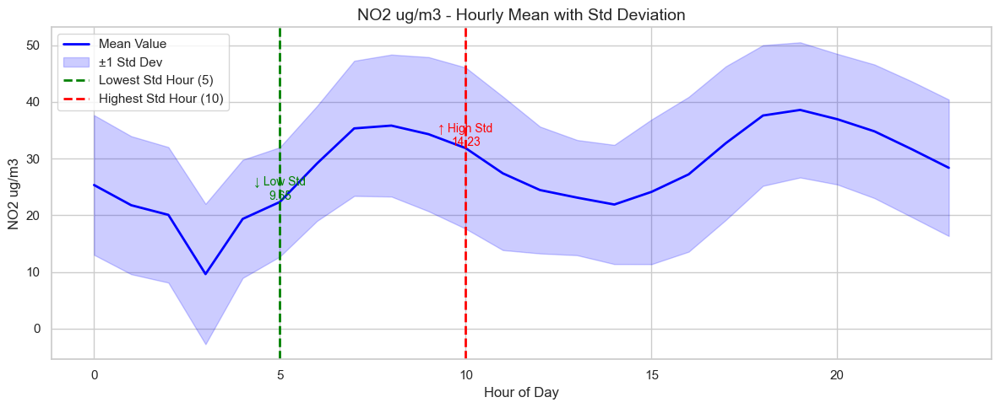

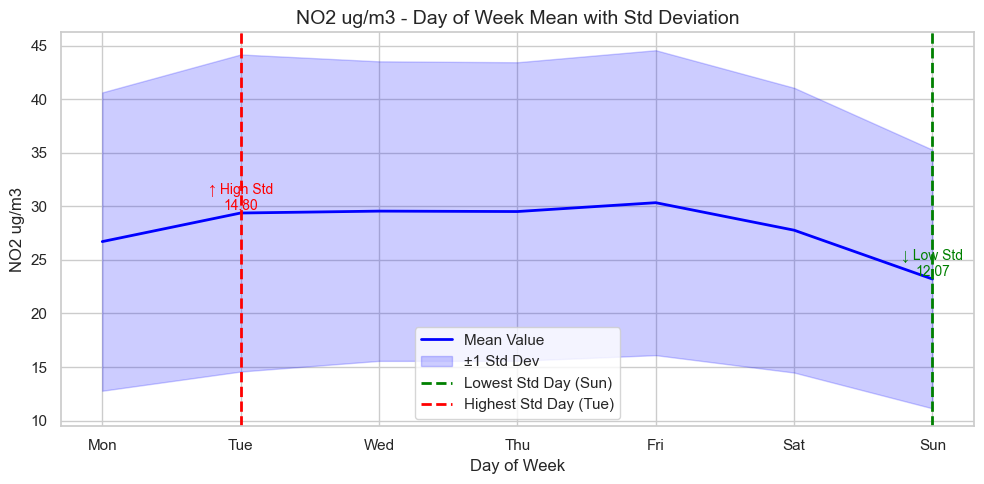

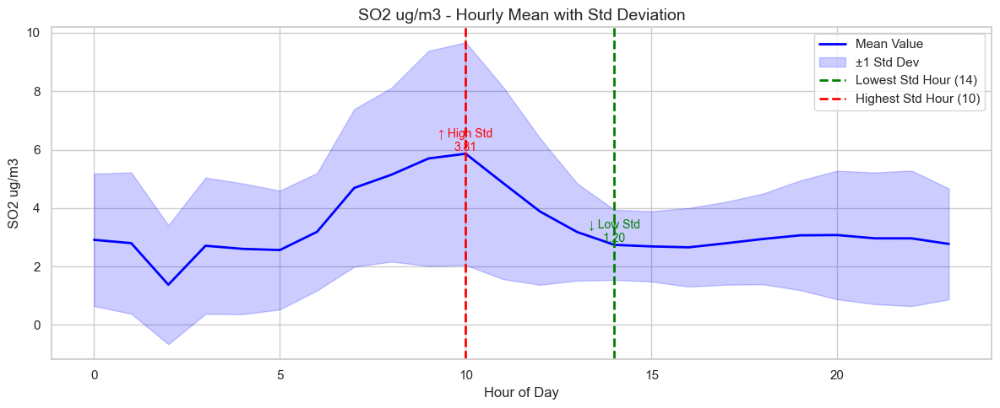

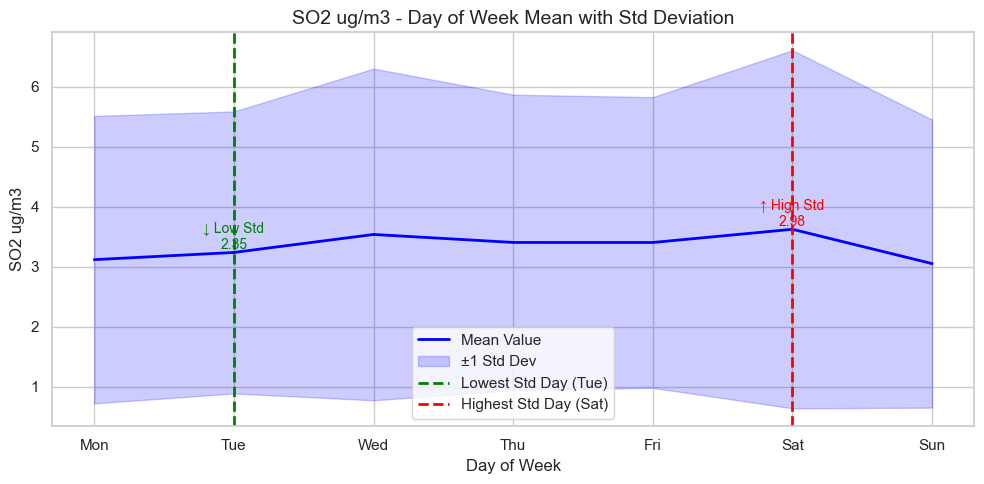

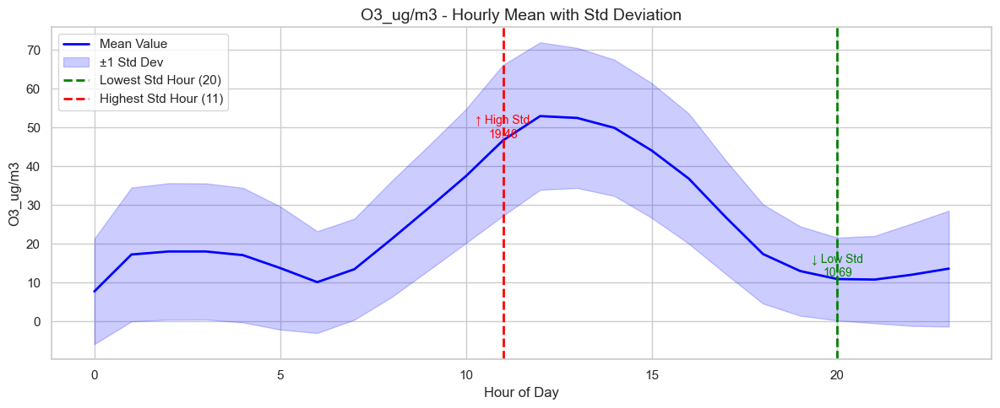

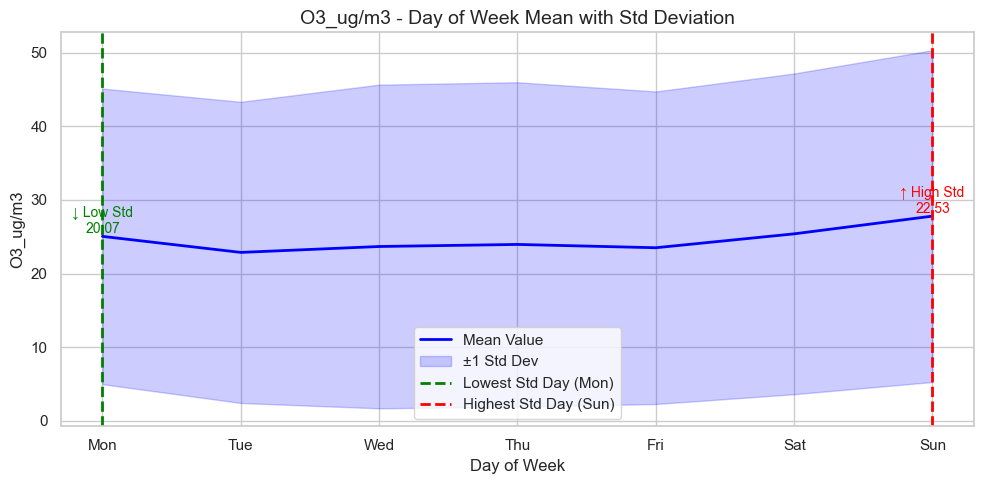

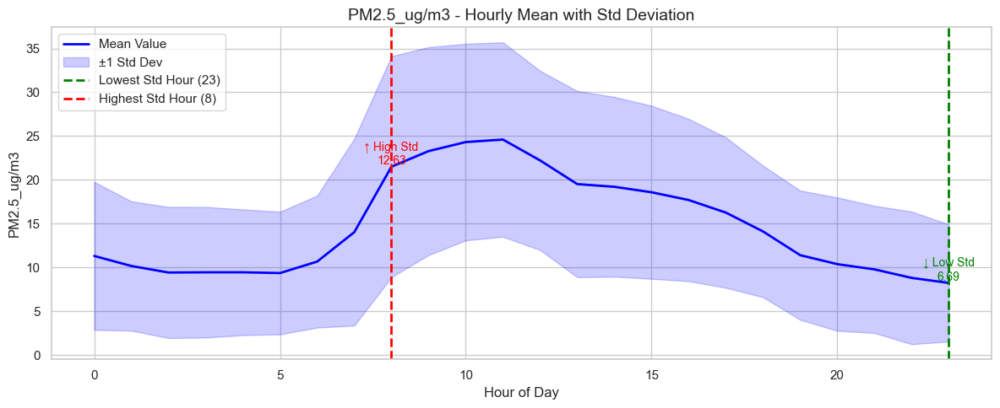

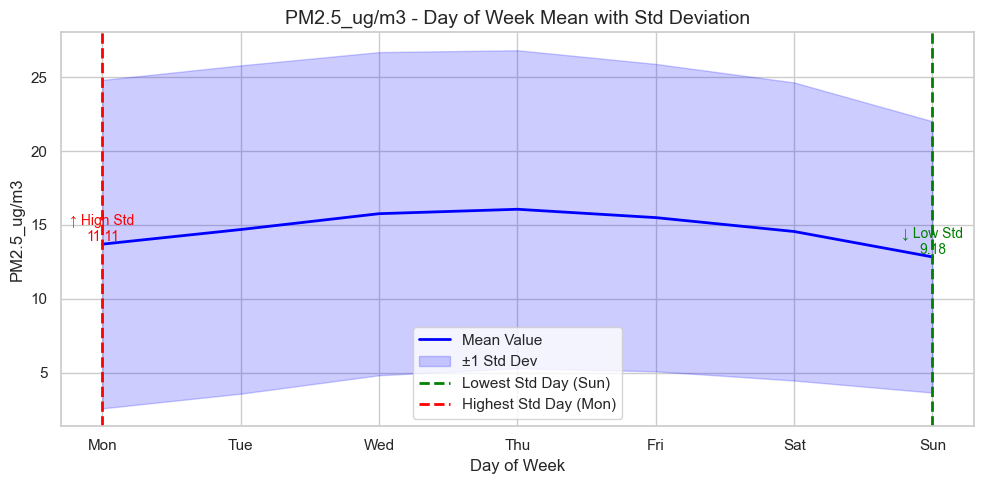

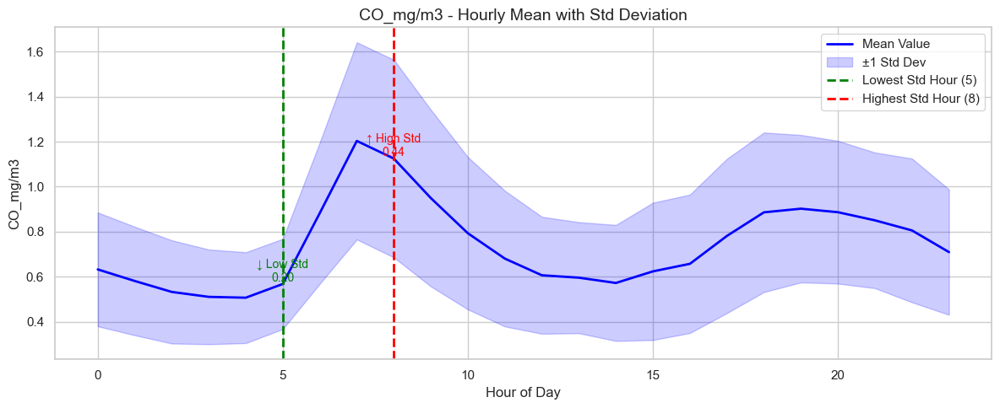

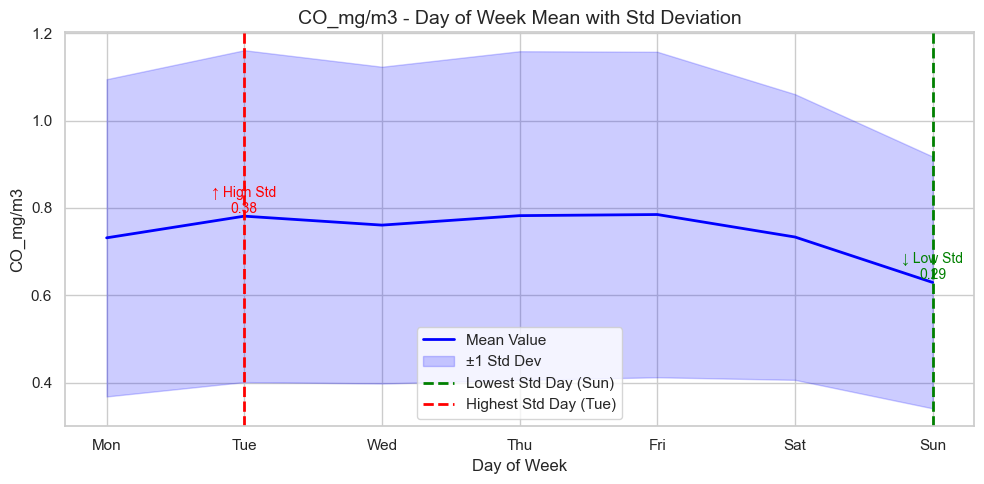

In [49]:
import matplotlib.pyplot as plt
import seaborn as sns

# Use a clean seaborn theme
sns.set(style="whitegrid")

# Ensure hourly stats are recalculated
hourly_stats = df_1y.groupby("hour")[pollutant_cols].agg(['mean', 'std'])
dow_stats = df_1y.groupby("dayofweek")[pollutant_cols].agg(['mean', 'std'])

# Dictionary to map day numbers to names
day_names = {0: 'Mon', 1: 'Tue', 2: 'Wed', 3: 'Thu', 4: 'Fri', 5: 'Sat', 6: 'Sun'}

for pollutant in pollutant_cols:
    # Hourly Plot
    mean_hour = hourly_stats[(pollutant, 'mean')]
    std_hour = hourly_stats[(pollutant, 'std')]
    low_hour = std_hour.idxmin()
    high_hour = std_hour.idxmax()

    plt.figure(figsize=(12, 5))
    plt.plot(mean_hour.index, mean_hour.values, label='Mean Value', color='blue', linewidth=2)
    plt.fill_between(mean_hour.index, 
                     mean_hour - std_hour, 
                     mean_hour + std_hour, 
                     color='blue', alpha=0.2, label='±1 Std Dev')

    # Mark min and max std deviation hours
    plt.axvline(low_hour, color='green', linestyle='--', linewidth=2, label=f'Lowest Std Hour ({low_hour})')
    plt.axvline(high_hour, color='red', linestyle='--', linewidth=2, label=f'Highest Std Hour ({high_hour})')

    # Annotate
    plt.text(low_hour, mean_hour[low_hour], f"↓ Low Std\n{std_hour[low_hour]:.2f}", 
             ha='center', va='bottom', color='green', fontsize=10)
    plt.text(high_hour, mean_hour[high_hour], f"↑ High Std\n{std_hour[high_hour]:.2f}", 
             ha='center', va='bottom', color='red', fontsize=10)

    plt.title(f"{pollutant} - Hourly Mean with Std Deviation", fontsize=14)
    plt.xlabel("Hour of Day")
    plt.ylabel(f"{pollutant}")
    plt.legend()
    plt.tight_layout()
    plt.grid(True)
    plt.show()

    # Day-of-week Plot
    mean_dow = dow_stats[(pollutant, 'mean')]
    std_dow = dow_stats[(pollutant, 'std')]
    low_dow = std_dow.idxmin()
    high_dow = std_dow.idxmax()

    plt.figure(figsize=(10, 5))
    x_labels = [day_names[d] for d in mean_dow.index]
    plt.plot(x_labels, mean_dow.values, label='Mean Value', color='blue', linewidth=2)
    plt.fill_between(x_labels, 
                     mean_dow - std_dow, 
                     mean_dow + std_dow, 
                     color='blue', alpha=0.2, label='±1 Std Dev')

    # Mark min and max std deviation days
    plt.axvline(x_labels[low_dow], color='green', linestyle='--', linewidth=2, label=f'Lowest Std Day ({day_names[low_dow]})')
    plt.axvline(x_labels[high_dow], color='red', linestyle='--', linewidth=2, label=f'Highest Std Day ({day_names[high_dow]})')

    # Annotate
    plt.text(x_labels[low_dow], mean_dow[low_dow], f"↓ Low Std\n{std_dow[low_dow]:.2f}", 
             ha='center', va='bottom', color='green', fontsize=10)
    plt.text(x_labels[high_dow], mean_dow[high_dow], f"↑ High Std\n{std_dow[high_dow]:.2f}", 
             ha='center', va='bottom', color='red', fontsize=10)

    plt.title(f"{pollutant} - Day of Week Mean with Std Deviation", fontsize=14)
    plt.xlabel("Day of Week")
    plt.ylabel(f"{pollutant}")
    plt.legend()
    plt.tight_layout()
    plt.grid(True)
    plt.show()


<h2><b>Relationship between pollutant and wather variable </b></h2>

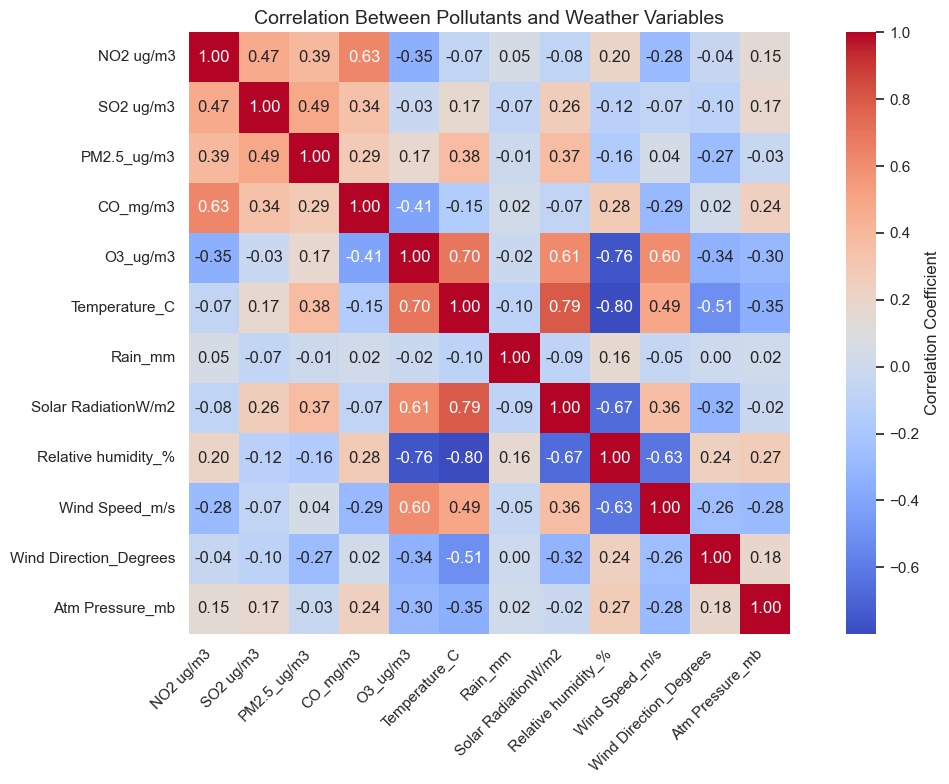

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt

# Define pollutant and weather variables
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3", "O3_ug/m3"]
weather = [
    'Temperature_C', 'Rain_mm', 'Solar RadiationW/m2',
    'Relative humidity_%', 'Wind Speed_m/s',
    'Wind Direction_Degrees', 'Atm Pressure_mb'
]

# Combine columns for correlation
corr_cols = pollutants + weather
df_corr = df_1y_clean[corr_cols].copy()

# Compute correlation matrix (Pearson by default)
corr_matrix = df_corr.corr()

# Plot correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True,
            cbar_kws={'label': 'Correlation Coefficient'})
plt.title("Correlation Between Pollutants and Weather Variables", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


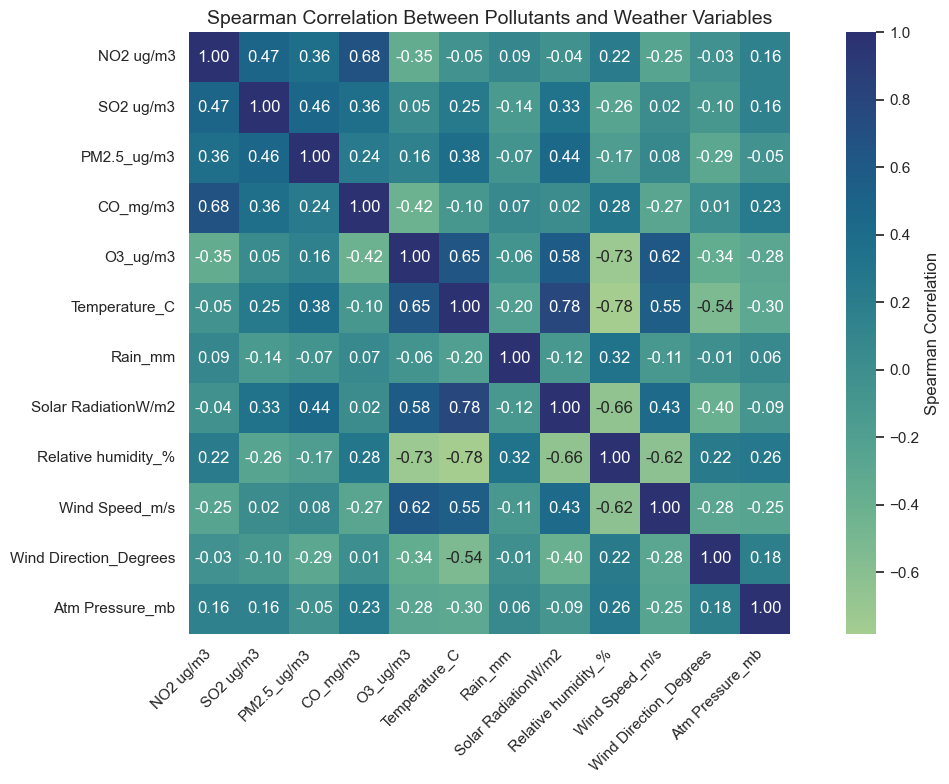

In [51]:
#Sparman correlation for non-linear relationships
import seaborn as sns
import matplotlib.pyplot as plt

# Define columns of interest
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3", "O3_ug/m3"]
weather = [
    'Temperature_C', 'Rain_mm', 'Solar RadiationW/m2',
    'Relative humidity_%', 'Wind Speed_m/s',
    'Wind Direction_Degrees', 'Atm Pressure_mb'
]

# Subset dataframe
df_spearman = df_1y_clean[pollutants + weather]

# Compute Spearman correlation matrix
spearman_corr = df_spearman.corr(method='spearman')

# Plot
plt.figure(figsize=(12, 8))
sns.heatmap(spearman_corr, annot=True, fmt=".2f", cmap="crest", square=True,
            cbar_kws={'label': 'Spearman Correlation'})
plt.title("Spearman Correlation Between Pollutants and Weather Variables", fontsize=14)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


<h2>SARIMA</h2>

Loaded dataset: (8784, 12) 2023-09-01 00:00:00 → 2024-08-31 23:00:00
Pollutants: ['NO2 ug/m3', 'SO2 ug/m3', 'PM2.5_ug/m3', 'CO_mg/m3']
First forecast anchor: 2024-03-01 00:00:00 | Final end: 2024-08-31 23:00:00

🧪 SARIMA Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00

🧪 SARIMA Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00

🧪 SARIMA Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00

🧪 SARIMA Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00

🧪 SARIMA Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Forecast 2024-03-13 00:00:00 → 2024-03-15 23:00:00

🧪 SARIMA Window 6: Train 2023-09-16 00:00:00 → 2024-03-15 23:00:00 | Forecast 2024-03-16 00:00:00 → 2024-03-18 23:00:00

🧪 SARIMA Window 7: Train 2023-09-19 00:00:00 → 2024-03-18 23:0

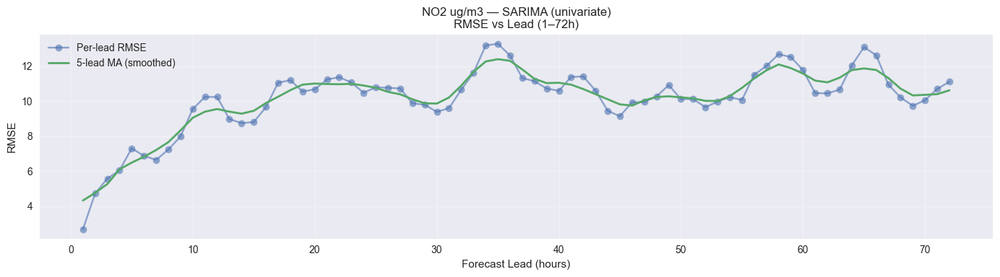

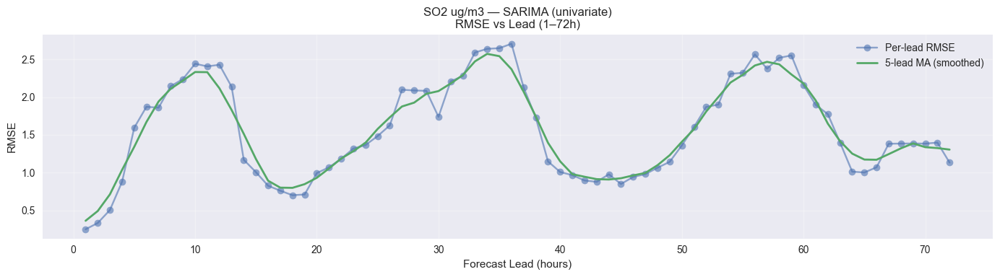

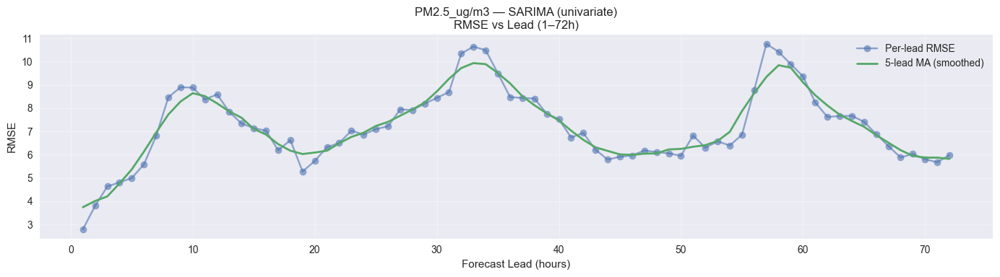

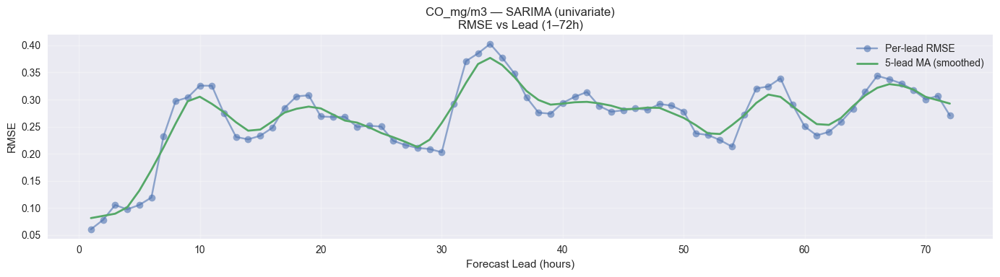


✅ COMPLETED: SARIMA rolling forecast (univariate, no leakage).
Outputs: C:\Users\User\OneDrive\Desktop\thesis\Result\SARIMA_Rolling_Univariate_NOLEAK


In [61]:
# =====================================================================
# SARIMA Rolling Forecast (univariate, per pollutant evaluation) — NO LEAKAGE
# - Uses ONLY each pollutant series (no meteorology, no exogenous)
# - Rolling windows:
#     * 6 months train
#     * 72h forecast horizon
#     * 72h step (3 days)
# - Output:
#     * Forecast panel (all windows)
#     * RMSE vs lead (raw + 5-lead moving average) per pollutant
#
# Notes (NO LEAKAGE):
# - For each window, SARIMA is fit ONLY on the train slice for that pollutant.
# - Forecast is produced for the next 72 hours without using any future pollutant values.
# - If NaNs exist in the training slice, they are imputed using TRAIN-only seasonal median by (dow,hour).
# =====================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

plt.style.use("seaborn-v0_8")

# --------------------------------------------------------------
# Paths
# --------------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
data_path   = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")

out_dir = os.path.join(results_dir, "SARIMA_Rolling_Univariate_NOLEAK")
os.makedirs(out_dir, exist_ok=True)

# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------
df = pd.read_csv(data_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()
print("Loaded dataset:", df.shape, df.index.min(), "→", df.index.max())

# --------------------------------------------------------------
# Pollutants (adjust if needed)
# --------------------------------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]  # add "O3_ug/m3" if desired
pollutants = [c for c in pollutants if c in df.columns]
print("Pollutants:", pollutants)

# --------------------------------------------------------------
# Rolling configuration
# --------------------------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(hours=72)  # 3 days
FH        = 72

FINAL_END  = df.index.max()
fc_start0  = (df.index.min() + TRAIN_LEN).floor("H")
print("First forecast anchor:", fc_start0, "| Final end:", FINAL_END)

# --------------------------------------------------------------
# Helpers
# --------------------------------------------------------------
def rmse_np(y_true, y_pred):
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    if mask.sum() == 0:
        return np.nan
    return float(np.sqrt(mean_squared_error(y_true[mask], y_pred[mask])))

# Train-only seasonal median imputation (by dow,hour)
def fit_seasonal_median(train_series: pd.Series):
    idx = train_series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    med = train_series.groupby([key["dow"], key["hour"]]).median()
    global_med = train_series.median()
    return med, global_med

def apply_seasonal_median(series: pd.Series, med, global_med):
    idx = series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    keys = pd.Series(list(zip(key["dow"].values, key["hour"].values)), index=idx)
    fill = keys.map(med)
    out = series.copy()
    out = out.where(out.notna(), fill)
    out = out.fillna(global_med)
    return out

def impute_train_only(train_series: pd.Series, apply_index: pd.DatetimeIndex):
    """
    Fit seasonal median on TRAIN series only; return:
      - imputed train series
      - "apply series" placeholders (for compatibility; not used by SARIMA)
    """
    if not train_series.isna().any():
        return train_series

    med, gmed = fit_seasonal_median(train_series)
    return apply_seasonal_median(train_series, med, gmed)

# Robust SARIMA forecaster (tries seasonal; falls back to non-seasonal)
def sarima_fit_forecast(train_series: pd.Series, steps: int, seasonal_period: int = 24):
    s = train_series.copy()

    # ensure numeric
    s = pd.to_numeric(s, errors="coerce")

    # train-only impute if needed
    s = impute_train_only(s, s.index)

    # if still missing, last-resort fill (train-only)
    if s.isna().any():
        s = s.interpolate(limit_direction="both")
        s = s.fillna(s.median())

    # seasonal daily SARIMA
    try:
        model = SARIMAX(
            s,
            order=(1, 0, 1),
            seasonal_order=(1, 0, 1, seasonal_period),
            trend="c",
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        res = model.fit(disp=False)
        fc = res.forecast(steps=steps)
        return np.asarray(fc)
    except Exception:
        # fallback: simpler model
        model = SARIMAX(
            s,
            order=(1, 0, 1),
            seasonal_order=(0, 0, 0, 0),
            trend="c",
            enforce_stationarity=False,
            enforce_invertibility=False
        )
        res = model.fit(disp=False)
        fc = res.forecast(steps=steps)
        return np.asarray(fc)

# --------------------------------------------------------------
# Run rolling windows — per pollutant
# --------------------------------------------------------------
all_rows = []
window = 0
fc_start = fc_start0

while True:
    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH-1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"\n🧪 SARIMA Window {window}: Train {train_start} → {train_end} | Forecast {fc_start} → {fc_end}")

    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    lead = np.arange(1, FH+1)

    for p in pollutants:
        y_train = df.loc[train_start:train_end, p].copy()

        # validity: negative -> NaN (pollutants should not be negative)
        y_train.loc[y_train < 0] = np.nan

        if y_train.dropna().shape[0] < 24 * 14:  # at least ~2 weeks
            # skip if too little data
            continue

        y_fc = sarima_fit_forecast(y_train, steps=FH, seasonal_period=24)

        # store long format for easy metrics later
        for i, t in enumerate(fc_idx):
            all_rows.append({
                "window": window,
                "pollutant": p,
                "t": t,
                "lead": int(lead[i]),
                "y_pred": float(y_fc[i]) if np.isfinite(y_fc[i]) else np.nan
            })

    fc_start += STEP

preds = pd.DataFrame(all_rows)
preds.to_csv(os.path.join(out_dir, "SARIMA_forecasts_long.csv"), index=False)
print("\nSaved SARIMA predictions:", preds.shape)

# --------------------------------------------------------------
# Compute per-lead RMSE for each pollutant
# --------------------------------------------------------------
metrics = []
for p in pollutants:
    p_pred = preds[preds["pollutant"] == p].copy()
    if p_pred.empty:
        continue

    # attach actuals
    p_pred["y_true"] = df.loc[p_pred["t"].values, p].values

    for h in range(1, FH+1):
        sub = p_pred[p_pred["lead"] == h].dropna(subset=["y_true", "y_pred"])
        metrics.append({
            "pollutant": p,
            "lead": h,
            "rmse": rmse_np(sub["y_true"].values, sub["y_pred"].values) if len(sub) else np.nan,
            "n": int(len(sub))
        })

metrics_df = pd.DataFrame(metrics)
metrics_df.to_csv(os.path.join(out_dir, "SARIMA_RMSE_by_lead.csv"), index=False)

# --------------------------------------------------------------
# Plot RMSE vs lead (raw + 5-lead MA) per pollutant
# --------------------------------------------------------------
for p in pollutants:
    sub = metrics_df[metrics_df["pollutant"] == p].sort_values("lead")
    if sub.empty:
        continue

    plt.figure(figsize=(14,4))
    plt.plot(sub["lead"], sub["rmse"], marker="o", alpha=0.6, label="Per-lead RMSE")

    sm = pd.Series(sub["rmse"].values, index=sub["lead"]).rolling(window=5, center=True, min_periods=1).mean()
    plt.plot(sm.index, sm.values, linewidth=2, label="5-lead MA (smoothed)")

    plt.title(f"{p} — SARIMA (univariate)\nRMSE vs Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"RMSE_by_lead_{p.replace('/','_').replace(' ','_')}.png"), dpi=200)
    plt.show()

print("\n✅ COMPLETED: SARIMA rolling forecast (univariate, no leakage).")
print("Outputs:", out_dir)


<h2>HOLTWINTER</h2>

Loaded dataset: (8784, 12) 2023-09-01 00:00:00 → 2024-08-31 23:00:00
Pollutants: ['NO2 ug/m3', 'SO2 ug/m3', 'PM2.5_ug/m3', 'CO_mg/m3']
First forecast anchor: 2024-03-01 00:00:00 | Final end: 2024-08-31 23:00:00

🧪 Holt-Winters Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00

🧪 Holt-Winters Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00

🧪 Holt-Winters Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00

🧪 Holt-Winters Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00

🧪 Holt-Winters Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Forecast 2024-03-13 00:00:00 → 2024-03-15 23:00:00

🧪 Holt-Winters Window 6: Train 2023-09-16 00:00:00 → 2024-03-15 23:00:00 | Forecast 2024-03-16 00:00:00 → 2024-03-18 23:00:00

🧪 Holt-Winters Window 7: T

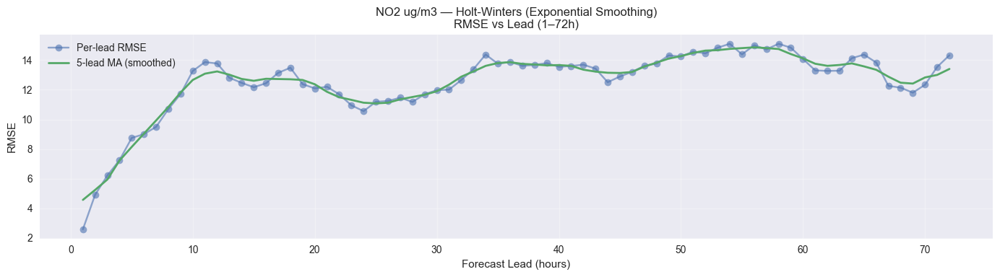

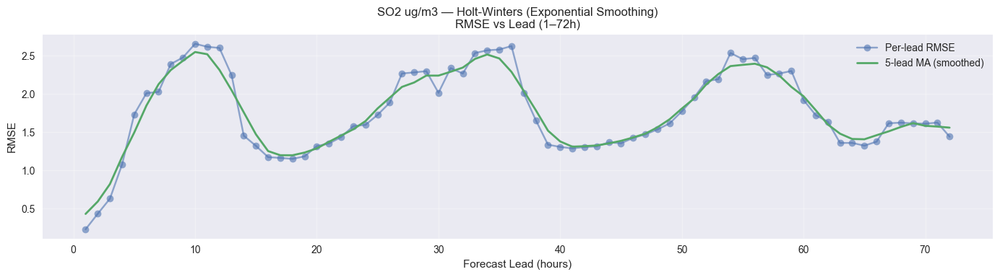

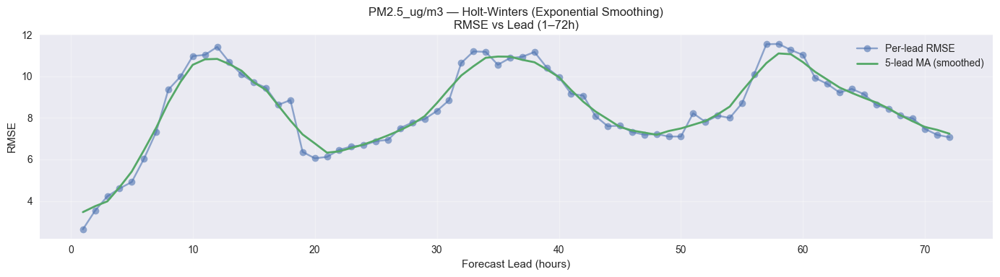

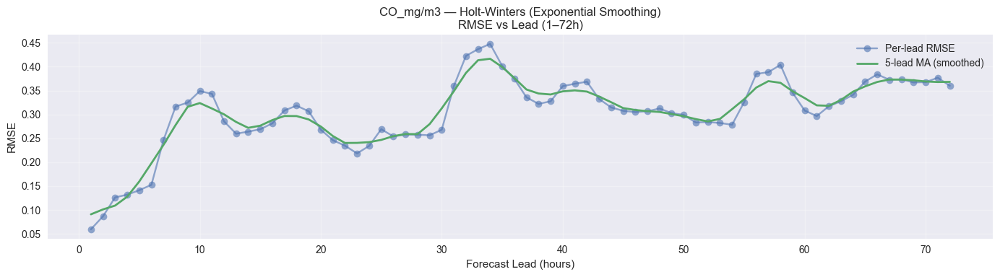


✅ COMPLETED: Holt-Winters rolling forecast (univariate, no leakage).
Outputs: C:\Users\User\OneDrive\Desktop\thesis\Result\HOLTWINTERS_Rolling_Univariate_NOLEAK


In [62]:
# =====================================================================
# Holt-Winters Rolling Forecast (Exponential Smoothing, univariate) — NO LEAKAGE
# - Uses ONLY each pollutant series (no meteorology, no exogenous)
# - Rolling windows:
#     * 6 months train
#     * 72h forecast horizon
#     * 72h step (3 days)
# - Output:
#     * Forecasts (long format) across all windows
#     * RMSE vs lead (raw + 5-lead moving average) per pollutant
#
# Notes (NO LEAKAGE):
# - For each window, Holt-Winters is fit ONLY on the train slice for that pollutant.
# - Forecast is produced for the next 72 hours without using any future pollutant values.
# - If NaNs exist in training slice, we impute using TRAIN-only seasonal median by (dow,hour).
# =====================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.holtwinters import ExponentialSmoothing
import warnings
warnings.filterwarnings("ignore")

plt.style.use("seaborn-v0_8")

# --------------------------------------------------------------
# Paths
# --------------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
data_path   = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")

out_dir = os.path.join(results_dir, "HOLTWINTERS_Rolling_Univariate_NOLEAK")
os.makedirs(out_dir, exist_ok=True)

# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------
df = pd.read_csv(data_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()
print("Loaded dataset:", df.shape, df.index.min(), "→", df.index.max())

# --------------------------------------------------------------
# Pollutants (adjust if needed)
# --------------------------------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]  # add "O3_ug/m3" if desired
pollutants = [c for c in pollutants if c in df.columns]
print("Pollutants:", pollutants)

# --------------------------------------------------------------
# Rolling configuration
# --------------------------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(hours=72)  # 3 days
FH        = 72

FINAL_END  = df.index.max()
fc_start0  = (df.index.min() + TRAIN_LEN).floor("H")
print("First forecast anchor:", fc_start0, "| Final end:", FINAL_END)

# --------------------------------------------------------------
# Helpers
# --------------------------------------------------------------
def rmse_np(y_true, y_pred):
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    if mask.sum() == 0:
        return np.nan
    return float(np.sqrt(mean_squared_error(y_true[mask], y_pred[mask])))

# Train-only seasonal median imputation (by dow,hour)
def fit_seasonal_median(train_series: pd.Series):
    idx = train_series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    med = train_series.groupby([key["dow"], key["hour"]]).median()
    global_med = train_series.median()
    return med, global_med

def apply_seasonal_median(series: pd.Series, med, global_med):
    idx = series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    keys = pd.Series(list(zip(key["dow"].values, key["hour"].values)), index=idx)
    fill = keys.map(med)
    out = series.copy()
    out = out.where(out.notna(), fill)
    out = out.fillna(global_med)
    return out

def impute_train_only(train_series: pd.Series) -> pd.Series:
    if not train_series.isna().any():
        return train_series
    med, gmed = fit_seasonal_median(train_series)
    return apply_seasonal_median(train_series, med, gmed)

# Robust Holt-Winters fit/forecast
def holtwinters_fit_forecast(train_series: pd.Series, steps: int, seasonal_periods: int = 24):
    s = train_series.copy()
    s = pd.to_numeric(s, errors="coerce")

    # train-only impute
    s = impute_train_only(s)

    # last-resort fill to avoid failures
    if s.isna().any():
        s = s.interpolate(limit_direction="both")
        s = s.fillna(s.median())

    # If the series is (nearly) constant, HW can behave oddly; fallback to naive mean forecast
    if np.nanstd(s.values) < 1e-8:
        return np.full(steps, float(np.nanmean(s.values)))

    # Seasonal HW (daily seasonality for hourly data)
    # Many pollutant series behave better with additive seasonality; try that first, fallback to multiplicative if needed.
    try:
        model = ExponentialSmoothing(
            s,
            trend="add",
            seasonal="add",
            seasonal_periods=seasonal_periods,
            initialization_method="estimated"
        )
        res = model.fit(optimized=True)
        fc = res.forecast(steps)
        return np.asarray(fc)
    except Exception:
        # fallback: no trend/seasonality
        model = ExponentialSmoothing(
            s,
            trend=None,
            seasonal=None,
            initialization_method="estimated"
        )
        res = model.fit(optimized=True)
        fc = res.forecast(steps)
        return np.asarray(fc)

# --------------------------------------------------------------
# Run rolling windows — per pollutant
# --------------------------------------------------------------
all_rows = []
window = 0
fc_start = fc_start0

while True:
    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH-1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"\n🧪 Holt-Winters Window {window}: Train {train_start} → {train_end} | Forecast {fc_start} → {fc_end}")

    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    lead = np.arange(1, FH+1)

    for p in pollutants:
        y_train = df.loc[train_start:train_end, p].copy()

        # validity: negative -> NaN
        y_train.loc[y_train < 0] = np.nan

        # ensure enough data (HW seasonal needs at least a few seasonal cycles)
        if y_train.dropna().shape[0] < 24 * 14:  # at least ~2 weeks
            continue

        y_fc = holtwinters_fit_forecast(y_train, steps=FH, seasonal_periods=24)

        for i, t in enumerate(fc_idx):
            all_rows.append({
                "window": window,
                "pollutant": p,
                "t": t,
                "lead": int(lead[i]),
                "y_pred": float(y_fc[i]) if np.isfinite(y_fc[i]) else np.nan
            })

    fc_start += STEP

preds = pd.DataFrame(all_rows)
preds.to_csv(os.path.join(out_dir, "HOLTWINTERS_forecasts_long.csv"), index=False)
print("\nSaved Holt-Winters predictions:", preds.shape)

# --------------------------------------------------------------
# Compute per-lead RMSE for each pollutant
# --------------------------------------------------------------
metrics = []
for p in pollutants:
    p_pred = preds[preds["pollutant"] == p].copy()
    if p_pred.empty:
        continue

    p_pred["y_true"] = df.loc[p_pred["t"].values, p].values

    for h in range(1, FH+1):
        sub = p_pred[p_pred["lead"] == h].dropna(subset=["y_true", "y_pred"])
        metrics.append({
            "pollutant": p,
            "lead": h,
            "rmse": rmse_np(sub["y_true"].values, sub["y_pred"].values) if len(sub) else np.nan,
            "n": int(len(sub))
        })

metrics_df = pd.DataFrame(metrics)
metrics_df.to_csv(os.path.join(out_dir, "HOLTWINTERS_RMSE_by_lead.csv"), index=False)

# --------------------------------------------------------------
# Plot RMSE vs lead (raw + 5-lead MA) per pollutant
# --------------------------------------------------------------
for p in pollutants:
    sub = metrics_df[metrics_df["pollutant"] == p].sort_values("lead")
    if sub.empty:
        continue

    plt.figure(figsize=(14,4))
    plt.plot(sub["lead"], sub["rmse"], marker="o", alpha=0.6, label="Per-lead RMSE")

    sm = pd.Series(sub["rmse"].values, index=sub["lead"]).rolling(window=5, center=True, min_periods=1).mean()
    plt.plot(sm.index, sm.values, linewidth=2, label="5-lead MA (smoothed)")

    plt.title(f"{p} — Holt-Winters (Exponential Smoothing)\nRMSE vs Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"RMSE_by_lead_{p.replace('/','_').replace(' ','_')}.png"), dpi=200)
    plt.show()

print("\n✅ COMPLETED: Holt-Winters rolling forecast (univariate, no leakage).")
print("Outputs:", out_dir)


<h2>VAR</h2>

Loaded: (8784, 12) 2023-09-01 00:00:00 → 2024-08-31 23:00:00
Pollutants: ['NO2 ug/m3', 'SO2 ug/m3', 'PM2.5_ug/m3', 'CO_mg/m3']
Met raw: ['Temperature_C', 'Rain_mm', 'Solar RadiationW/m2', 'Relative humidity_%', 'Wind Speed_m/s', 'Wind Direction_Degrees', 'Atm Pressure_mb']
VAR system cols: 21
First forecast anchor: 2024-03-01 00:00:00 | Final end: 2024-08-31 23:00:00

🧪 VAR Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00

🧪 VAR Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00

🧪 VAR Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00

🧪 VAR Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00

🧪 VAR Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Forecast 2024-03-13 00:00:00 → 2024-03-15 23:00:00

🧪 VAR Window 6: Train 2023-09-16 00:00:

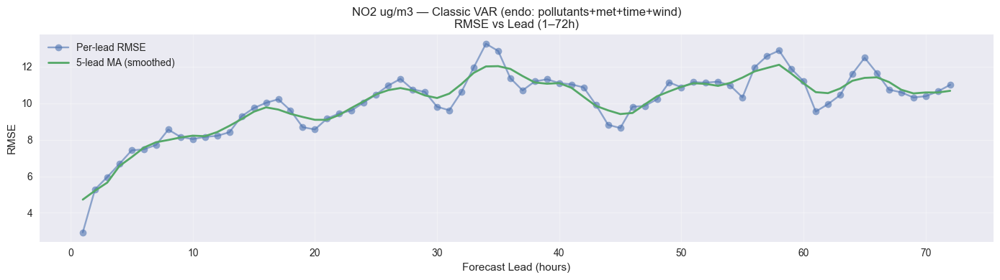

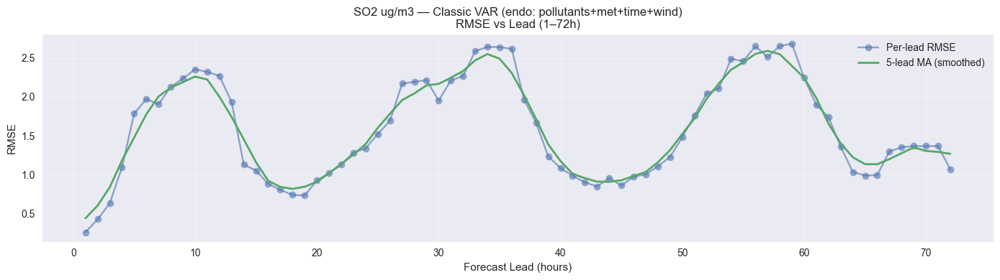

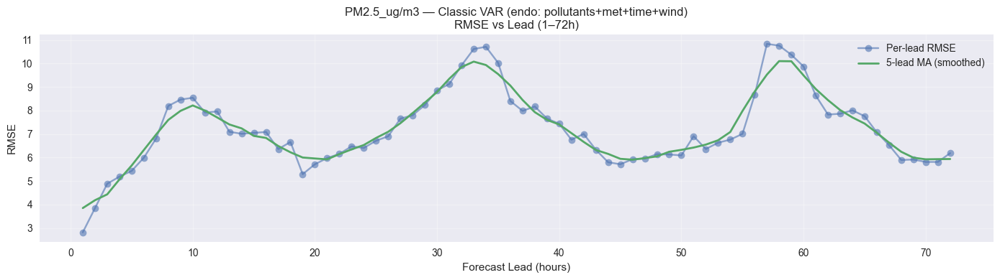

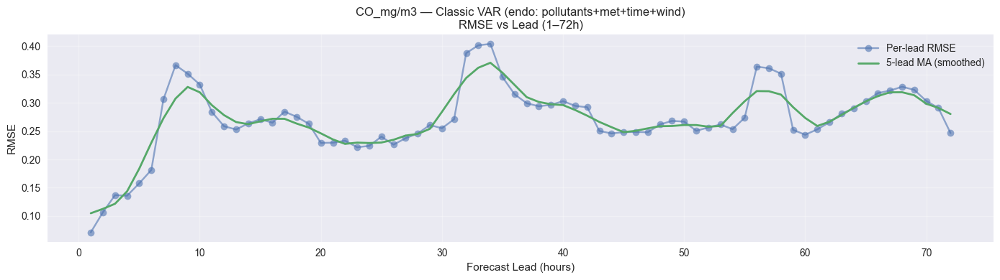


✅ COMPLETED: classic multivariate VAR rolling forecast (no leakage).
Outputs: C:\Users\User\OneDrive\Desktop\thesis\Result\VAR_CLASSIC_AllEndo_MetTimeWind_Scaled_NOLEAK


In [11]:
# =====================================================================
# Classic Multivariate VAR Rolling Forecast — NO LEAKAGE
# - Endogenous VAR system includes:
#     * Pollutants (multivariate)
#     * Meteorology
#     * Wind encodings (wd_sin/wd_cos + wind_u/wind_v)
#     * Temporal encodings (hour/dow/doy sin/cos + weekend)
# - Lags handled by VAR(p) (selected by AIC on TRAIN only)
# - Rolling:
#     * 6 months train
#     * 72h horizon
#     * 72h step (3 days)
# - Evaluation:
#     * RMSE vs lead (raw + 5-lead moving average) per pollutant
# =====================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.api import VAR
import warnings
warnings.filterwarnings("ignore")

plt.style.use("seaborn-v0_8")

# --------------------------------------------------------------
# Paths
# --------------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
data_path   = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")

out_dir = os.path.join(results_dir, "VAR_CLASSIC_AllEndo_MetTimeWind_Scaled_NOLEAK")
os.makedirs(out_dir, exist_ok=True)

# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------
df = pd.read_csv(data_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()
print("Loaded:", df.shape, df.index.min(), "→", df.index.max())

# --------------------------------------------------------------
# Define variables
# --------------------------------------------------------------
POLLUTANTS = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]  # add "O3_ug/m3" if needed
POLLUTANTS = [c for c in POLLUTANTS if c in df.columns]

MET_RAW = [
    "Temperature_C", "Rain_mm", "Solar RadiationW/m2",
    "Relative humidity_%", "Wind Speed_m/s",
    "Wind Direction_Degrees", "Atm Pressure_mb"
]
MET_RAW = [c for c in MET_RAW if c in df.columns]

print("Pollutants:", POLLUTANTS)
print("Met raw:", MET_RAW)

# --------------------------------------------------------------
# Temporal encodings (you requested to include them as endogenous)
# --------------------------------------------------------------
df["hour"] = df.index.hour
df["dow"]  = df.index.dayofweek
df["doy"]  = df.index.dayofyear

df["hour_sin"] = np.sin(2*np.pi*df["hour"]/24)
df["hour_cos"] = np.cos(2*np.pi*df["hour"]/24)
df["dow_sin"]  = np.sin(2*np.pi*df["dow"]/7)
df["dow_cos"]  = np.cos(2*np.pi*df["dow"]/7)
df["doy_sin"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["doy_cos"]  = np.cos(2*np.pi*df["doy"]/365.25)
df["is_weekend"] = (df["dow"] >= 5).astype(int)

TIME_COLS = ["hour_sin","hour_cos","dow_sin","dow_cos","doy_sin","doy_cos","is_weekend"]

# --------------------------------------------------------------
# Wind encoding (replace raw wind direction degrees)
# --------------------------------------------------------------
if "Wind Direction_Degrees" in df.columns:
    rad = np.deg2rad(df["Wind Direction_Degrees"])
    df["wd_sin"] = np.sin(rad)
    df["wd_cos"] = np.cos(rad)
else:
    df["wd_sin"] = np.nan
    df["wd_cos"] = np.nan

if "Wind Speed_m/s" in df.columns:
    df["wind_u"] = df["Wind Speed_m/s"] * df["wd_cos"]
    df["wind_v"] = df["Wind Speed_m/s"] * df["wd_sin"]
else:
    df["wind_u"] = np.nan
    df["wind_v"] = np.nan

# Meteorology columns (exclude raw wind direction, include encoded wind)
MET_COLS = [c for c in MET_RAW if c != "Wind Direction_Degrees"]
for c in ["wd_sin","wd_cos","wind_u","wind_v"]:
    if c in df.columns and c not in MET_COLS:
        MET_COLS.append(c)

# --------------------------------------------------------------
# Full VAR endogenous system = pollutants + met + time
# --------------------------------------------------------------
VAR_COLS = [c for c in (POLLUTANTS + MET_COLS + TIME_COLS) if c in df.columns]
print("VAR system cols:", len(VAR_COLS))

# --------------------------------------------------------------
# Rolling configuration
# --------------------------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(hours=72)  # 3 days
FH        = 72

FINAL_END = df.index.max()
fc_start0 = (df.index.min() + TRAIN_LEN).floor("H")
print("First forecast anchor:", fc_start0, "| Final end:", FINAL_END)

# --------------------------------------------------------------
# VAR settings
# --------------------------------------------------------------
MAX_P = 24  # cap lag order search (keeps model stable)

# --------------------------------------------------------------
# Helpers
# --------------------------------------------------------------
def rmse_np(y_true, y_pred):
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    if mask.sum() == 0:
        return np.nan
    return float(np.sqrt(mean_squared_error(y_true[mask], y_pred[mask])))

# Train-only seasonal median imputer (dow,hour)
def fit_seasonal_median(train_series: pd.Series):
    idx = train_series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    med = train_series.groupby([key["dow"], key["hour"]]).median()
    global_med = train_series.median()
    return med, global_med

def apply_seasonal_median(series: pd.Series, med, global_med):
    idx = series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    keys = pd.Series(list(zip(key["dow"].values, key["hour"].values)), index=idx)
    fill = keys.map(med)
    out = series.copy()
    out = out.where(out.notna(), fill)
    out = out.fillna(global_med)
    return out

def train_only_impute(train_df: pd.DataFrame, fc_df: pd.DataFrame, cols):
    """
    Fit imputation rules on TRAIN only; apply to train+forecast frames (NO LEAKAGE).
    """
    tr = train_df.copy()
    fc = fc_df.copy()

    cols = [c for c in cols if c in tr.columns and c in fc.columns]
    if not (tr[cols].isna().any().any() or fc[cols].isna().any().any()):
        return tr, fc

    for c in cols:
        tr[c] = pd.to_numeric(tr[c], errors="coerce")
        fc[c] = pd.to_numeric(fc[c], errors="coerce")

        med, gmed = fit_seasonal_median(tr[c])
        tr[c] = apply_seasonal_median(tr[c], med, gmed)
        fc[c] = apply_seasonal_median(fc[c], med, gmed)

    return tr, fc

def standardize_train_apply(train_df: pd.DataFrame, fc_df: pd.DataFrame, cols):
    """
    Train-only standardization (mean/std from TRAIN only).
    Apply to both train + forecast matrices (NO LEAKAGE).
    """
    tr = train_df.copy()
    fc = fc_df.copy()

    mu = tr[cols].mean(axis=0)
    sd = tr[cols].std(axis=0).replace(0, 1.0)

    tr[cols] = (tr[cols] - mu) / sd
    fc[cols] = (fc[cols] - mu) / sd

    return tr, fc, mu, sd

def inv_standardize(df_std: pd.DataFrame, mu: pd.Series, sd: pd.Series, cols):
    out = df_std.copy()
    out[cols] = out[cols] * sd[cols] + mu[cols]
    return out

def select_p_aic(train_mat: pd.DataFrame, max_p: int) -> int:
    """
    Choose lag order p by AIC using TRAIN only.
    """
    m = VAR(train_mat)
    try:
        sel = m.select_order(max_p)
        p = int(sel.aic)
        if p < 1:
            p = 1
        return p
    except Exception:
        return 1

# --------------------------------------------------------------
# One rolling window VAR forecast
# --------------------------------------------------------------
def var_window_forecast(train_start, train_end, fc_start, fc_end):
    fc_idx = pd.date_range(fc_start, fc_end, freq="H")

    train_raw = df.loc[train_start:train_end, VAR_COLS].copy().asfreq("H")
    fc_raw    = df.loc[fc_start:fc_end,   VAR_COLS].copy().asfreq("H")

    # Validity: negative pollutants -> NaN (common rule)
    for p in POLLUTANTS:
        if p in train_raw.columns:
            train_raw.loc[train_raw[p] < 0, p] = np.nan
        if p in fc_raw.columns:
            fc_raw.loc[fc_raw[p] < 0, p] = np.nan

    # Train-only impute to ensure full matrix (VAR needs complete)
    train_imp, fc_imp = train_only_impute(train_raw, fc_raw, cols=VAR_COLS)

    # Ensure numeric
    train_imp = train_imp.apply(pd.to_numeric, errors="coerce")
    fc_imp    = fc_imp.apply(pd.to_numeric, errors="coerce")

    # Last resort: drop remaining NaNs in train (should be minimal after impute)
    train_imp = train_imp.dropna(axis=0)
    if len(train_imp) < 24 * 21:  # ~3 weeks minimum
        return None

    # Standardize (train-only)
    train_std, fc_std, mu, sd = standardize_train_apply(train_imp, fc_imp, cols=VAR_COLS)

    # choose lag p on TRAIN only
    p = select_p_aic(train_std, max_p=MAX_P)
    p = min(p, max(1, len(train_std)//10))  # safety cap

    # Fit VAR(p)
    try:
        res = VAR(train_std).fit(p)
    except Exception:
        p = 1
        res = VAR(train_std).fit(p)

    # Forecast in standardized space using last p train rows ONLY (no leakage)
    y0 = train_std.values[-p:, :]
    fc_vals = res.forecast(y=y0, steps=FH)
    fc_std_pred = pd.DataFrame(fc_vals, index=fc_idx, columns=VAR_COLS)

    # Invert standardization back to original units
    fc_pred = inv_standardize(fc_std_pred, mu, sd, cols=VAR_COLS)

    # Return only pollutant forecasts + lead
    out = fc_pred[POLLUTANTS].copy()
    out["lead"] = np.arange(1, FH+1)
    return out

# --------------------------------------------------------------
# Run rolling windows
# --------------------------------------------------------------
all_windows = []
window = 0
fc_start = fc_start0

while True:
    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH-1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"\n🧪 VAR Window {window}: Train {train_start} → {train_end} | Forecast {fc_start} → {fc_end}")

    pred = var_window_forecast(train_start, train_end, fc_start, fc_end)
    if pred is None:
        print("   ⚠ skipped (insufficient data / fit failure)")
        fc_start += STEP
        continue

    pred["window"] = window
    all_windows.append(pred)

    fc_start += STEP

panel = pd.concat(all_windows) if all_windows else pd.DataFrame()
panel.to_csv(os.path.join(out_dir, "VAR_forecasts_all_windows.csv"))
print("\nSaved VAR forecast panel:", panel.shape)

# --------------------------------------------------------------
# RMSE by lead (pollutants only)
# --------------------------------------------------------------
metrics = []
for p in POLLUTANTS:
    if panel.empty:
        continue

    tmp = panel[[p, "lead"]].copy()
    tmp["actual"] = df.loc[tmp.index, p].values

    for h in range(1, FH+1):
        sub = tmp[tmp["lead"] == h].dropna(subset=[p, "actual"])
        metrics.append({
            "pollutant": p,
            "lead": h,
            "rmse": rmse_np(sub["actual"].values, sub[p].values) if len(sub) else np.nan,
            "n": int(len(sub))
        })

metrics_df = pd.DataFrame(metrics)
metrics_df.to_csv(os.path.join(out_dir, "VAR_RMSE_by_lead.csv"), index=False)

# --------------------------------------------------------------
# Plot RMSE vs lead (raw + 5-lead MA)
# --------------------------------------------------------------
for p in POLLUTANTS:
    sub = metrics_df[metrics_df["pollutant"] == p].sort_values("lead")
    if sub.empty:
        continue

    plt.figure(figsize=(14,4))
    plt.plot(sub["lead"], sub["rmse"], marker="o", alpha=0.6, label="Per-lead RMSE")
    sm = pd.Series(sub["rmse"].values, index=sub["lead"]).rolling(window=5, center=True, min_periods=1).mean()
    plt.plot(sm.index, sm.values, linewidth=2, label="5-lead MA (smoothed)")

    plt.title(f"{p} — Classic VAR (endo: pollutants+met+time+wind)\nRMSE vs Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"RMSE_by_lead_{p.replace('/','_').replace(' ','_')}.png"), dpi=200)
    plt.show()

print("\n✅ COMPLETED: classic multivariate VAR rolling forecast (no leakage).")
print("Outputs:", out_dir)


<h2>GBM</h2>

Loaded dataset: (8784, 12) 2023-09-01 00:00:00 → 2024-08-31 23:00:00
Pollutants: ['NO2 ug/m3', 'SO2 ug/m3', 'PM2.5_ug/m3', 'CO_mg/m3']
Weather: ['Temperature_C', 'Rain_mm', 'Solar RadiationW/m2', 'Relative humidity_%', 'Wind Speed_m/s', 'Wind Direction_Degrees', 'Atm Pressure_mb']
First possible forecast anchor: 2024-03-01 00:00:00 | Final end: 2024-08-31 23:00:00

🧪 Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00

🧪 Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00

🧪 Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00

🧪 Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00 → 2024-03-12 23:00:00

🧪 Window 5: Train 2023-09-13 00:00:00 → 2024-03-12 23:00:00 | Forecast 2024-03-13 00:00:00 → 2024-03-15 23:00:00

🧪 Window 6: Train 2023-09-16 00:00:00 → 2024-03-15 23:00:00 | 

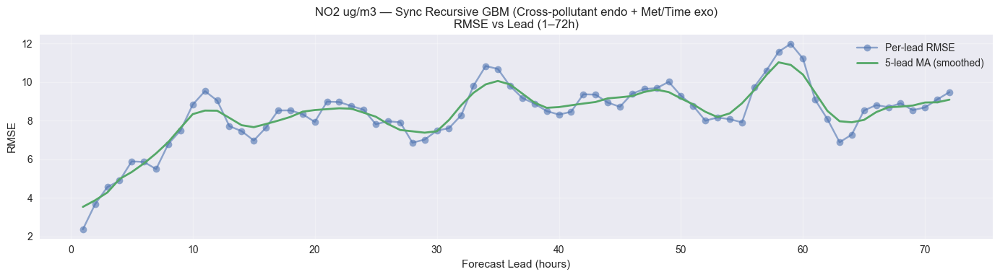

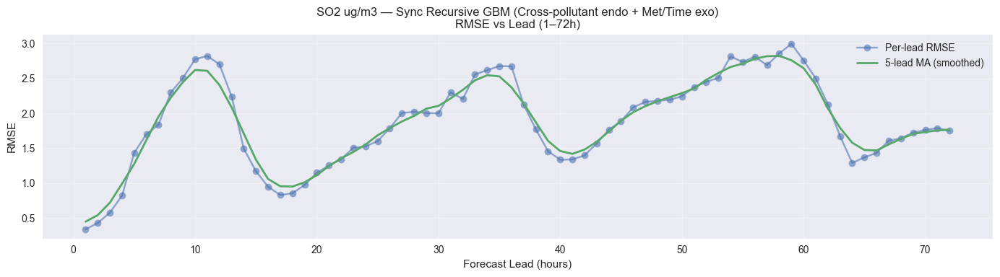

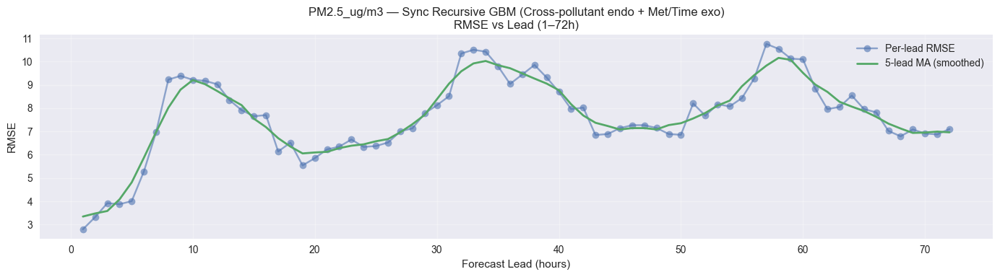

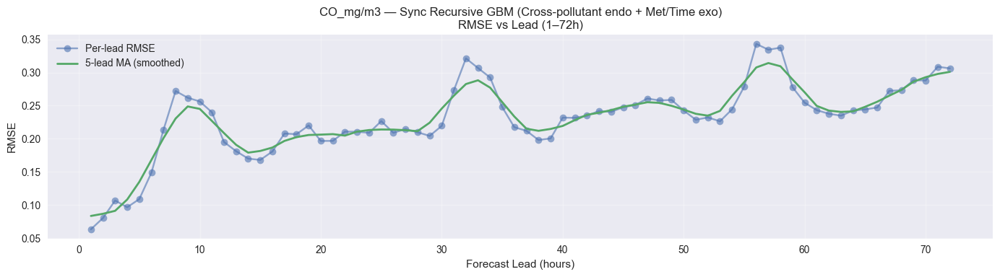


✅ COMPLETED: synchronized recursive GBM (RMSE-only outputs).
Outputs: C:\Users\User\OneDrive\Desktop\thesis\Result\GBM_SyncRecursive_CrossPollutant_Lag72_Roll_EncodedWind_DOY_Impute_RMSEonly


In [63]:
# =====================================================================
# Synchronized Recursive GBM Rolling Forecast (ALL pollutants endo)
# - 6-month rolling window, 3-day step, 72-hour horizon
# - Exogenous: meteorology + temporal (hour/dow/doy sin/cos) + weekend + wind encoding (sin/cos + u/v)
# - Endogenous: cross-pollutant lags (1,2,3,6,12,24,48,72) + rolling stats (24h, 72h mean/std)
# - Train-only seasonal-median imputation (dow,hour) if any NaNs exist (NO LEAKAGE)
# - Separate GBM per pollutant, BUT synchronized recursive forecasting updates ALL pollutants each step
# - Metrics per lead: RMSE (raw + smoothed)
# =====================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from dateutil.relativedelta import relativedelta
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings("ignore")

plt.style.use("seaborn-v0_8")

# --------------------------------------------------------------
# Paths
# --------------------------------------------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
data_path   = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")

out_dir = os.path.join(results_dir, "GBM_SyncRecursive_CrossPollutant_Lag72_Roll_EncodedWind_DOY_Impute_RMSEonly")
os.makedirs(out_dir, exist_ok=True)

# --------------------------------------------------------------
# Load data
# --------------------------------------------------------------
df = pd.read_csv(data_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()
print("Loaded dataset:", df.shape, df.index.min(), "→", df.index.max())

# --------------------------------------------------------------
# Variables
# --------------------------------------------------------------
pollutants = ["NO2 ug/m3", "SO2 ug/m3", "PM2.5_ug/m3", "CO_mg/m3"]  # add "O3_ug/m3" if you want

weather_raw = [
    "Temperature_C", "Rain_mm", "Solar RadiationW/m2",
    "Relative humidity_%", "Wind Speed_m/s",
    "Wind Direction_Degrees", "Atm Pressure_mb"
]

# keep only columns that exist
pollutants = [c for c in pollutants if c in df.columns]
weather_raw = [c for c in weather_raw if c in df.columns]
print("Pollutants:", pollutants)
print("Weather:", weather_raw)

# --------------------------------------------------------------
# Temporal + wind features (EXOG)
# - Julian day = day-of-year (doy)
# --------------------------------------------------------------
df["hour"] = df.index.hour
df["dow"]  = df.index.dayofweek
df["doy"]  = df.index.dayofyear

df["hour_sin"] = np.sin(2*np.pi*df["hour"]/24)
df["hour_cos"] = np.cos(2*np.pi*df["hour"]/24)
df["dow_sin"]  = np.sin(2*np.pi*df["dow"]/7)
df["dow_cos"]  = np.cos(2*np.pi*df["dow"]/7)
df["doy_sin"]  = np.sin(2*np.pi*df["doy"]/365.25)
df["doy_cos"]  = np.cos(2*np.pi*df["doy"]/365.25)

df["is_weekend"] = (df["dow"] >= 5).astype(int)

# Wind encoding (replace raw wind direction)
if "Wind Direction_Degrees" in df.columns:
    rad = np.deg2rad(df["Wind Direction_Degrees"])
    df["wd_sin"] = np.sin(rad)
    df["wd_cos"] = np.cos(rad)
else:
    df["wd_sin"] = np.nan
    df["wd_cos"] = np.nan

if "Wind Speed_m/s" in df.columns:
    df["wind_u"] = df["Wind Speed_m/s"] * df["wd_cos"]
    df["wind_v"] = df["Wind Speed_m/s"] * df["wd_sin"]
else:
    df["wind_u"] = np.nan
    df["wind_v"] = np.nan

time_feats = ["hour_sin","hour_cos","dow_sin","dow_cos","doy_sin","doy_cos","is_weekend"]
wind_feats = ["wd_sin","wd_cos","wind_u","wind_v"]

# Exogenous set: meteorology (excluding raw wind direction) + encoded wind + temporal
weather_exog = [c for c in weather_raw if c != "Wind Direction_Degrees"]
exog_cols = weather_exog + wind_feats + time_feats
exog_cols = [c for c in exog_cols if c in df.columns]

# --------------------------------------------------------------
# Endogenous feature config (lags + rolling stats)
# --------------------------------------------------------------
LAG_SET = [1,2,3,6,12,24,48,72]
ROLL_WINDOWS = [24, 72]

# --------------------------------------------------------------
# GBM params
# --------------------------------------------------------------
GBM_PARAMS = dict(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=3,
    subsample=0.8,
    min_samples_leaf=20,
    random_state=42
)

# --------------------------------------------------------------
# Helpers
# --------------------------------------------------------------
def rmse_np(y_true, y_pred):
    mask = np.isfinite(y_true) & np.isfinite(y_pred)
    if mask.sum() == 0:
        return np.nan
    return float(np.sqrt(mean_squared_error(y_true[mask], y_pred[mask])))

def build_sample_weights(y, peak_quantile=0.90, peak_weight=3.0, base_weight=1.0):
    thr = np.quantile(y[np.isfinite(y)], peak_quantile)
    w = np.where(y >= thr, peak_weight, base_weight)
    return w, thr

# --- Train-only seasonal median imputer (by dow, hour) ---
def fit_seasonal_median(train_series: pd.Series):
    idx = train_series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    med = train_series.groupby([key["dow"], key["hour"]]).median()
    global_med = train_series.median()
    return med, global_med

def apply_seasonal_median(series: pd.Series, med, global_med):
    idx = series.index
    key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
    keys = pd.Series(list(zip(key["dow"].values, key["hour"].values)), index=idx)
    fill = keys.map(med)
    out = series.copy()
    out = out.where(out.notna(), fill)
    out = out.fillna(global_med)
    return out

def train_only_impute_if_needed(train_df: pd.DataFrame, apply_df: pd.DataFrame, cols):
    if not (train_df[cols].isna().any().any() or apply_df[cols].isna().any().any()):
        return train_df, apply_df

    train_out = train_df.copy()
    apply_out = apply_df.copy()

    for c in cols:
        med, gmed = fit_seasonal_median(train_out[c])
        train_out[c] = apply_seasonal_median(train_out[c], med, gmed)
        apply_out[c] = apply_seasonal_median(apply_out[c], med, gmed)

    return train_out, apply_out

def build_endo_features_from_history(hist_df: pd.DataFrame, t: pd.Timestamp, pollutants, lag_set, roll_windows):
    feats = {}
    for p in pollutants:
        for L in lag_set:
            feats[f"{p}_lag{L}"] = float(hist_df.at[t - pd.Timedelta(hours=L), p])
        for w in roll_windows:
            past = hist_df.loc[t - pd.Timedelta(hours=w): t - pd.Timedelta(hours=1), p].values
            feats[f"{p}_roll{w}_mean"] = float(np.nanmean(past))
            feats[f"{p}_roll{w}_std"]  = float(np.nanstd(past))
    return feats

# --------------------------------------------------------------
# Rolling window configuration
# --------------------------------------------------------------
TRAIN_LEN = relativedelta(months=6)
STEP      = pd.Timedelta(days=3)
FH        = 72

FINAL_END  = df.index.max()
fc_start0  = (df.index.min() + TRAIN_LEN).floor("H")
print("First possible forecast anchor:", fc_start0, "| Final end:", FINAL_END)

# --------------------------------------------------------------
# Synchronized recursive forecast for ONE window
# --------------------------------------------------------------
def gbm_sync_recursive_window(train_start, train_end, fc_start, fc_end):
    train_raw = df.loc[train_start:train_end, pollutants + exog_cols].copy()
    fc_raw    = df.loc[fc_start:fc_end,   pollutants + exog_cols].copy()

    # negative pollutants -> NaN
    for p in pollutants:
        train_raw.loc[train_raw[p] < 0, p] = np.nan
        fc_raw.loc[fc_raw[p] < 0, p] = np.nan

    # train-only impute if needed
    cols_need = pollutants + exog_cols
    train_clean, fc_clean = train_only_impute_if_needed(train_raw, fc_raw, cols_need)

    # build training features
    feat_df = train_clean[exog_cols].copy()
    for p in pollutants:
        for L in LAG_SET:
            feat_df[f"{p}_lag{L}"] = train_clean[p].shift(L)
        for w in ROLL_WINDOWS:
            feat_df[f"{p}_roll{w}_mean"] = train_clean[p].shift(1).rolling(w).mean()
            feat_df[f"{p}_roll{w}_std"]  = train_clean[p].shift(1).rolling(w).std()

    train_mat = feat_df.join(train_clean[pollutants], how="inner").dropna(axis=0)
    if len(train_mat) < 800:
        print("   ⚠ Too few train rows after feature build:", len(train_mat))
        return None

    X_train = train_mat[feat_df.columns].values
    Y_train = train_mat[pollutants]

    # train model per pollutant
    models = {}
    for p in pollutants:
        y = Y_train[p].values
        wts, _thr = build_sample_weights(y, peak_quantile=0.90, peak_weight=3.0, base_weight=1.0)
        m = GradientBoostingRegressor(**GBM_PARAMS)
        m.fit(X_train, y, sample_weight=wts)
        models[p] = m

    # recursive forecast synchronized
    fc_idx = pd.date_range(fc_start, fc_end, freq="H")
    preds = pd.DataFrame(index=fc_idx, columns=pollutants, dtype=float)

    need_hours = max(max(LAG_SET), max(ROLL_WINDOWS))
    hist_start = train_end - pd.Timedelta(hours=need_hours + 5)
    hist_df = train_clean.loc[hist_start:train_end, pollutants].copy().asfreq("H")

    if hist_df.isna().any().any():
        hist_df = hist_df.interpolate(limit_direction="both")

    for t in fc_idx:
        exo = fc_clean.loc[t, exog_cols].to_dict()
        endo = build_endo_features_from_history(hist_df, t, pollutants, LAG_SET, ROLL_WINDOWS)
        x_row = {**exo, **endo}
        X_t = pd.DataFrame([x_row], index=[t]).values

        yhat = {p: float(models[p].predict(X_t)[0]) for p in pollutants}
        preds.loc[t, :] = pd.Series(yhat)
        hist_df.loc[t, :] = pd.Series(yhat)

    return preds

# --------------------------------------------------------------
# Run rolling windows
# --------------------------------------------------------------
all_windows = []
window = 0
fc_start = fc_start0

while True:
    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH-1)

    if fc_end > FINAL_END:
        break

    window += 1
    print(f"\n🧪 Window {window}: Train {train_start} → {train_end} | Forecast {fc_start} → {fc_end}")

    fc_pred = gbm_sync_recursive_window(train_start, train_end, fc_start, fc_end)
    if fc_pred is None:
        fc_start += STEP
        continue

    fc_pred["window"] = window
    fc_pred["lead"] = np.arange(1, FH+1)
    all_windows.append(fc_pred)

    fc_start += STEP

panel = pd.concat(all_windows)
panel.to_csv(os.path.join(out_dir, "GBM_sync_forecasts_all_windows.csv"))
print("\nSaved forecast panel:", panel.shape)

# --------------------------------------------------------------
# Metrics by lead: RMSE only
# --------------------------------------------------------------
metrics = []
for p in pollutants:
    df_p = panel[[p, "lead"]].copy()
    df_p["actual"] = df.loc[df_p.index, p]

    for h in range(1, FH+1):
        sub = df_p[df_p["lead"] == h].dropna(subset=[p, "actual"])
        if len(sub) == 0:
            metrics.append({"pollutant": p, "lead": h, "rmse": np.nan, "n": 0})
            continue
        metrics.append({
            "pollutant": p, "lead": h,
            "rmse": rmse_np(sub["actual"].values, sub[p].values),
            "n": int(len(sub))
        })

metrics_df = pd.DataFrame(metrics)
metrics_df.to_csv(os.path.join(out_dir, "GBM_RMSE_by_lead.csv"), index=False)

# --------------------------------------------------------------
# Plots per pollutant: RMSE raw + smoothed
# --------------------------------------------------------------
for p in pollutants:
    sub = metrics_df[metrics_df["pollutant"] == p].sort_values("lead")

    plt.figure(figsize=(14,4))
    plt.plot(sub["lead"], sub["rmse"], marker="o", alpha=0.6, label="Per-lead RMSE")

    sm = pd.Series(sub["rmse"].values, index=sub["lead"]).rolling(window=5, center=True, min_periods=1).mean()
    plt.plot(sm.index, sm.values, linewidth=2, label="5-lead MA (smoothed)")

    plt.title(f"{p} — Sync Recursive GBM (Cross-pollutant endo + Met/Time exo)\nRMSE vs Lead (1–72h)")
    plt.xlabel("Forecast Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"RMSE_by_lead_{p.replace('/','_').replace(' ','_')}.png"), dpi=200)
    plt.show()

print("\n✅ COMPLETED: synchronized recursive GBM (RMSE-only outputs).")
print("Outputs:", out_dir)


<h2>Hybrid(SARIMA + GBM)</h2>

Loaded: (8784, 12) 2023-09-01 00:00:00 → 2024-08-31 23:00:00
Pollutants: {'NO2 ug/m3': 'NO2 ug/m3', 'SO2 ug/m3': 'SO2 ug/m3', 'PM2.5 ug/m3': 'PM2.5_ug/m3', 'CO mg/m3': 'CO_mg/m3'}
Met raw: ['Temperature_C', 'Rain_mm', 'Solar RadiationW/m2', 'Relative humidity_%', 'Wind Speed_m/s', 'Wind Direction_Degrees', 'Atm Pressure_mb']
SARIMA met cols: ['Temperature_C', 'Rain_mm', 'Solar RadiationW/m2', 'Relative humidity_%', 'Atm Pressure_mb', 'Wind Speed_m/s', 'wd_sin', 'wd_cos']
First anchor: 2024-03-01 00:00:00 | Final end: 2024-08-31 23:00:00

🧪 WNMv3 Window 1: Train 2023-09-01 00:00:00 → 2024-02-29 23:00:00 | Forecast 2024-03-01 00:00:00 → 2024-03-03 23:00:00

🧪 WNMv3 Window 2: Train 2023-09-04 00:00:00 → 2024-03-03 23:00:00 | Forecast 2024-03-04 00:00:00 → 2024-03-06 23:00:00

🧪 WNMv3 Window 3: Train 2023-09-07 00:00:00 → 2024-03-06 23:00:00 | Forecast 2024-03-07 00:00:00 → 2024-03-09 23:00:00

🧪 WNMv3 Window 4: Train 2023-09-10 00:00:00 → 2024-03-09 23:00:00 | Forecast 2024-03-10 00:00:00

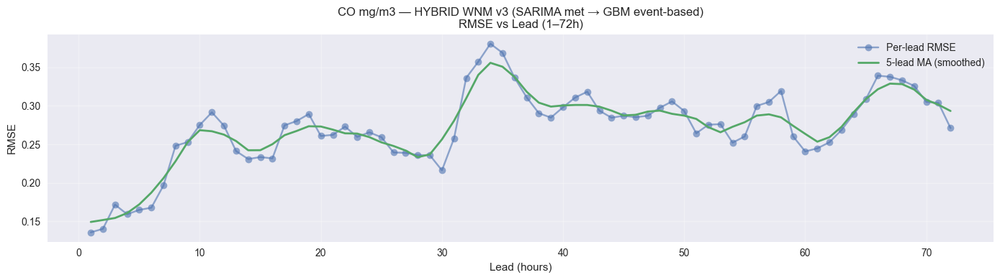

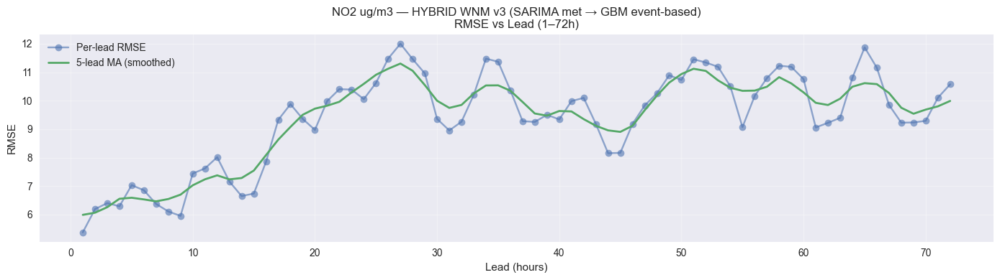

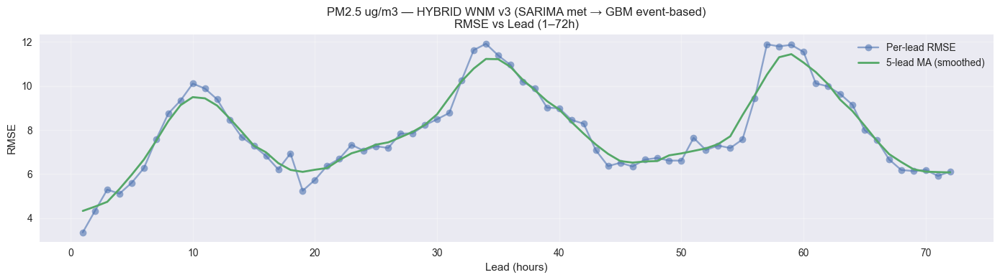

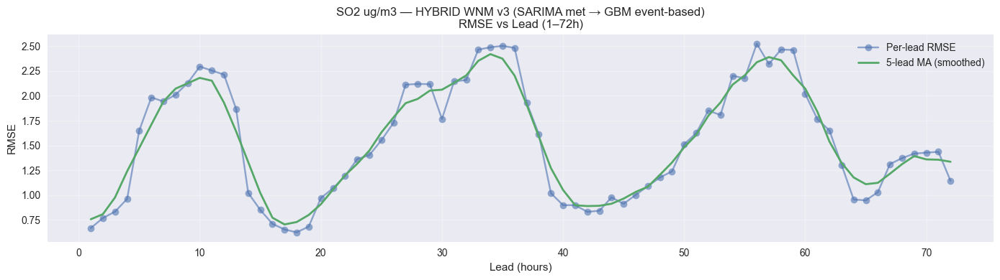


✅ COMPLETED: HYBRID WNM v3 (met-only, SARIMA hindcast+forecast → GBM), NO leakage, NO pollutant lags.
Outputs: C:\Users\User\OneDrive\Desktop\thesis\Result\HYBRID_WNMv3_SARIMAmetHindcast_to_GBM_EventBased_PeakWeighted_NOENDO_NOLEAK


In [9]:
# =====================================================================
# HYBRID WNM v3 (STRONG, met-only) — NO LEAKAGE
#
# Core requirement (your WNM):
#   1) SARIMA trains on past meteorology and forecasts meteorology.
#   2) GBM predicts pollution FROM forecasted meteorology (+ met lag/roll drivers + temporal EXO).
#   3) NO pollutant lags / NO pollutant endo features.
#
# Improvement vs plain hybrid:
#   - Train GBM on SARIMA "hindcast" meteorology inside TRAIN (forecast-like met) ✅
#   - Add met lag/rolling/anomaly drivers (computed from forecast-like met stream)
#   - Add temporal EXO (hour/dow/doy/weekend/holiday)
#   - Event-based modeling per pollutant (peak classifier + two regressors)
#   - Peak-weighted training and weighted RMSE reporting
#
# Rolling evaluation (NO LEAKAGE):
#   - 6 months train
#   - 72h horizon
#   - 72h step
#
# Outputs:
#   - Forecast panel CSV
#   - Metrics by lead CSV: RMSE + wRMSE
#   - RMSE vs lead plots (raw + 5-lead MA) per pollutant
# =====================================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from dateutil.relativedelta import relativedelta
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import HistGradientBoostingRegressor, HistGradientBoostingClassifier
from statsmodels.tsa.statespace.sarimax import SARIMAX
import warnings
warnings.filterwarnings("ignore")

plt.style.use("seaborn-v0_8")

# -------------------------
# Paths
# -------------------------
results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
data_path   = os.path.join(results_dir, "clean_preprocessed_1year_outlierHandled.csv")
out_dir = os.path.join(results_dir, "HYBRID_WNMv3_SARIMAmetHindcast_to_GBM_EventBased_PeakWeighted_NOENDO_NOLEAK")
os.makedirs(out_dir, exist_ok=True)

# -------------------------
# Load
# -------------------------
df = pd.read_csv(data_path, parse_dates=["Date_Time"], index_col="Date_Time")
df = df.asfreq("H").sort_index()
print("Loaded:", df.shape, df.index.min(), "→", df.index.max())

# -------------------------
# Pollutants (exclude O3)
# -------------------------
def pick_existing(cols, candidates):
    for c in candidates:
        if c in cols:
            return c
    return None

POLLUTANT_CANDIDATES = {
    "NO2 ug/m3":   ["NO2 ug/m3","NO2_ug/m3","no2_ugm3","no2 ug/m3"],
    "SO2 ug/m3":   ["SO2 ug/m3","SO2_ug/m3","so2_ugm3","so2 ug/m3"],
    "PM2.5 ug/m3": ["PM2.5_ug/m3","PM2.5 ug/m3","pm25_ugm3","pm2.5_ugm3"],
    "CO mg/m3":    ["CO_mg/m3","CO mg/m3","co_mgm3","co mg/m3"],
}

poll_map = {}
for canon, vars_ in POLLUTANT_CANDIDATES.items():
    hit = pick_existing(df.columns, vars_)
    if hit is not None:
        poll_map[canon] = hit

if not poll_map:
    raise RuntimeError("No pollutant columns detected (NO2/SO2/PM2.5/CO).")

POLL_COLS  = list(poll_map.values())             # actual df columns
POLL_LABEL = {v: k for k, v in poll_map.items()} # pretty label
print("Pollutants:", poll_map)

# -------------------------
# Meteorology + wind encoding
# -------------------------
met_raw = [
    "Temperature_C", "Rain_mm", "Solar RadiationW/m2",
    "Relative humidity_%", "Wind Speed_m/s",
    "Wind Direction_Degrees", "Atm Pressure_mb"
]
met_raw = [c for c in met_raw if c in df.columns]
if not met_raw:
    raise RuntimeError("No meteorology columns found.")
print("Met raw:", met_raw)

# wind encoding
if "Wind Direction_Degrees" in df.columns:
    rad = np.deg2rad(df["Wind Direction_Degrees"])
    df["wd_sin"] = np.sin(rad)
    df["wd_cos"] = np.cos(rad)
else:
    df["wd_sin"] = np.nan
    df["wd_cos"] = np.nan

if "Wind Speed_m/s" in df.columns:
    df["wind_u"] = df["Wind Speed_m/s"] * df["wd_cos"]
    df["wind_v"] = df["Wind Speed_m/s"] * df["wd_sin"]
else:
    df["wind_u"] = np.nan
    df["wind_v"] = np.nan

# SARIMA meteorology targets (univariate)
sarima_met_cols = []
for c in ["Temperature_C","Rain_mm","Solar RadiationW/m2","Relative humidity_%","Atm Pressure_mb","Wind Speed_m/s"]:
    if c in df.columns:
        sarima_met_cols.append(c)
sarima_met_cols += [c for c in ["wd_sin","wd_cos"] if c in df.columns]
sarima_met_cols = [c for c in sarima_met_cols if c in df.columns]
print("SARIMA met cols:", sarima_met_cols)

GBM_MET_BASE = list(dict.fromkeys(sarima_met_cols + ["wind_u","wind_v"]))

# -------------------------
# Temporal EXO features
# -------------------------
def make_time_features(index: pd.DatetimeIndex) -> pd.DataFrame:
    out = pd.DataFrame(index=index)
    hour = index.hour
    dow  = index.dayofweek
    doy  = index.dayofyear

    out["hour_sin"] = np.sin(2*np.pi*hour/24)
    out["hour_cos"] = np.cos(2*np.pi*hour/24)
    out["dow_sin"]  = np.sin(2*np.pi*dow/7)
    out["dow_cos"]  = np.cos(2*np.pi*dow/7)
    out["doy_sin"]  = np.sin(2*np.pi*doy/365.25)
    out["doy_cos"]  = np.cos(2*np.pi*doy/365.25)
    out["is_weekend"] = (dow >= 5).astype(int)

    out["is_holiday"] = 0
    try:
        import holidays
        hcal = holidays.country_holidays("US")  # change if needed
        out["is_holiday"] = pd.Series([d.normalize() in hcal for d in index], index=index).astype(int).values
    except Exception:
        pass
    return out

TIME_COLS = ["hour_sin","hour_cos","dow_sin","dow_cos","doy_sin","doy_cos","is_weekend","is_holiday"]

# -------------------------
# Train-only seasonal median impute (NO LEAKAGE)
# -------------------------
def seasonal_impute_train_only(train_df: pd.DataFrame, apply_df: pd.DataFrame, cols):
    cols = [c for c in cols if c in train_df.columns and c in apply_df.columns]
    if not cols:
        return train_df, apply_df
    if not (train_df[cols].isna().any().any() or apply_df[cols].isna().any().any()):
        return train_df, apply_df

    tr, ap = train_df.copy(), apply_df.copy()

    for c in cols:
        s_tr = pd.to_numeric(tr[c], errors="coerce")
        idx = s_tr.index
        key = pd.DataFrame({"dow": idx.dayofweek, "hour": idx.hour}, index=idx)
        med = s_tr.groupby([key["dow"], key["hour"]]).median()
        gmed = s_tr.median()

        def _apply(series):
            s = pd.to_numeric(series, errors="coerce")
            idx2 = s.index
            key2 = pd.DataFrame({"dow": idx2.dayofweek, "hour": idx2.hour}, index=idx2)
            keys = pd.Series(list(zip(key2["dow"].values, key2["hour"].values)), index=idx2)
            fill = keys.map(med)
            out = s.where(s.notna(), fill)
            return out.fillna(gmed)

        tr[c] = _apply(tr[c])
        ap[c] = _apply(ap[c])

    return tr, ap

# -------------------------
# SARIMA fit → (hindcast 1-step ahead) + (forecast 72h)
# -------------------------
def sarima_fit(train_series: pd.Series, sp: int = 24):
    s = pd.to_numeric(train_series, errors="coerce").copy()
    if s.isna().any():
        s = s.interpolate(limit_direction="both").fillna(s.median())

    candidates = [
        ((1,0,1), (1,0,1,sp)),
        ((1,1,1), (1,0,1,sp)),
        ((1,0,1), (0,0,0,0)),
    ]
    last_err = None
    for order, sorder in candidates:
        try:
            m = SARIMAX(
                s,
                order=order,
                seasonal_order=sorder,
                trend="c",
                enforce_stationarity=False,
                enforce_invertibility=False
            )
            r = m.fit(disp=False)
            return r
        except Exception as e:
            last_err = e
    raise RuntimeError(f"SARIMA failed: {last_err}")

def sarima_hindcast_1step(res, index_train: pd.DatetimeIndex) -> pd.Series:
    # 1-step-ahead predictions from Kalman filter
    arr = np.asarray(res.filter_results.forecasts[0], dtype=float)
    s = pd.Series(arr, index=index_train)
    return s

def sarima_forecast_steps(res, steps: int) -> np.ndarray:
    return np.asarray(res.get_forecast(steps=steps).predicted_mean, dtype=float)

def build_met_hindcast_and_forecast(met_train: pd.DataFrame, fc_idx: pd.DatetimeIndex) -> (pd.DataFrame, pd.DataFrame):
    met_hat_train = pd.DataFrame(index=met_train.index, columns=sarima_met_cols, dtype=float)
    met_fc = pd.DataFrame(index=fc_idx, columns=sarima_met_cols, dtype=float)

    for c in sarima_met_cols:
        res = sarima_fit(met_train[c], sp=24)
        met_hat_train[c] = sarima_hindcast_1step(res, met_train.index)
        met_fc[c] = sarima_forecast_steps(res, steps=len(fc_idx))

    # constraints for physical sanity
    for mdf in (met_hat_train, met_fc):
        if "Rain_mm" in mdf.columns:
            mdf["Rain_mm"] = mdf["Rain_mm"].clip(lower=0)
        if "Wind Speed_m/s" in mdf.columns:
            mdf["Wind Speed_m/s"] = mdf["Wind Speed_m/s"].clip(lower=0)
        if "wd_sin" in mdf.columns:
            mdf["wd_sin"] = mdf["wd_sin"].clip(-1, 1)
        if "wd_cos" in mdf.columns:
            mdf["wd_cos"] = mdf["wd_cos"].clip(-1, 1)

    # derive wind_u/v on both
    def add_uv(mdf):
        out = mdf.copy()
        if ("Wind Speed_m/s" in out.columns) and ("wd_sin" in out.columns) and ("wd_cos" in out.columns):
            out["wind_u"] = out["Wind Speed_m/s"] * out["wd_cos"]
            out["wind_v"] = out["Wind Speed_m/s"] * out["wd_sin"]
        else:
            out["wind_u"] = np.nan
            out["wind_v"] = np.nan
        return out

    return add_uv(met_hat_train), add_uv(met_fc)

# -------------------------
# Met drivers: lags/rolls/anomaly (from forecast-like met stream)
# -------------------------
MET_LAGS = [0, 1, 3, 6, 12, 24]
MET_ROLL = [24, 72]

def add_met_features(met_df: pd.DataFrame) -> pd.DataFrame:
    feat = pd.DataFrame(index=met_df.index)

    # base met
    for c in GBM_MET_BASE:
        feat[c] = met_df[c] if c in met_df.columns else np.nan

    # lags
    for c in GBM_MET_BASE:
        for L in MET_LAGS:
            if L == 0:
                continue
            feat[f"{c}_lag{L}"] = feat[c].shift(L)

    # rolling + anomaly
    for c in GBM_MET_BASE:
        for w in MET_ROLL:
            m = feat[c].shift(1).rolling(w).mean()
            s = feat[c].shift(1).rolling(w).std()
            feat[f"{c}_roll{w}_mean"] = m
            feat[f"{c}_roll{w}_std"]  = s
            feat[f"{c}_anom{w}"]      = feat[c] - m

    return feat

# -------------------------
# Peak-weighted training + metrics (weighted RMSE)
# -------------------------
def build_peak_weights(y, q=0.90, peak_w=6.0, base_w=1.0):
    y = np.asarray(y, dtype=float)
    yv = y[np.isfinite(y)]
    if len(yv) == 0:
        return None, np.nan
    thr = np.quantile(yv, q)
    w = np.where(y >= thr, peak_w, base_w).astype(float)
    return w, float(thr)

def rmse_np(y_true, y_pred):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    if m.sum() == 0:
        return np.nan
    return float(np.sqrt(mean_squared_error(y_true[m], y_pred[m])))

def weighted_rmse_eval(y_true, y_pred, q=0.90, peak_w=6.0, base_w=1.0):
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    if m.sum() == 0:
        return np.nan
    yt = y_true[m]
    yp = y_pred[m]
    thr = np.quantile(yt, q)
    w = np.where(yt >= thr, peak_w, base_w).astype(float)
    return float(np.sqrt(np.average((yt - yp) ** 2, weights=w)))

# -------------------------
# Rolling config (NO LEAKAGE)
# -------------------------
TRAIN_LEN = relativedelta(months=6)
FH        = 72
STEP      = pd.Timedelta(hours=72)
FINAL_END = df.index.max()
fc_start0 = (df.index.min() + TRAIN_LEN).floor("H")
print("First anchor:", fc_start0, "| Final end:", FINAL_END)

# -------------------------
# Models: event-based (peak classifier + 2 regressors)
# -------------------------
def make_regressor():
    return HistGradientBoostingRegressor(
        loss="squared_error",
        learning_rate=0.05,
        max_depth=6,
        max_iter=700,
        min_samples_leaf=30,
        l2_regularization=0.0,
        random_state=42
    )

def make_classifier():
    return HistGradientBoostingClassifier(
        learning_rate=0.05,
        max_depth=5,
        max_iter=400,
        min_samples_leaf=40,
        random_state=42
    )

# -------------------------
# One window: TRUE WNM training on SARIMA-hindcast met
# -------------------------
def wnm_window(train_start, train_end, fc_start, fc_end, peak_q=0.90):
    fc_idx = pd.date_range(fc_start, fc_end, freq="H")

    # TRAIN observed met (only for SARIMA fit)
    met_train = df.loc[train_start:train_end, sarima_met_cols].copy().apply(pd.to_numeric, errors="coerce")
    if met_train.isna().any().any():
        met_train, _ = seasonal_impute_train_only(met_train, met_train.copy(), cols=met_train.columns.tolist())

    # Build SARIMA hindcast met (train) + forecast met (future)
    met_hat_train, met_fc = build_met_hindcast_and_forecast(met_train, fc_idx)

    # TRAIN targets (pollution) - no future used
    y_train = df.loc[train_start:train_end, POLL_COLS].copy()
    for p in POLL_COLS:
        y_train.loc[y_train[p] < 0, p] = np.nan
    if y_train.isna().any().any():
        y_train, _ = seasonal_impute_train_only(y_train, y_train.copy(), cols=y_train.columns.tolist())

    # TIME features (EXO)
    time_train = make_time_features(met_hat_train.index)
    time_fc    = make_time_features(fc_idx)

    # Feature stream for TRAIN uses met_hat_train (forecast-like met) ✅
    X_train_met = add_met_features(met_hat_train)
    X_train_df = pd.concat([X_train_met, time_train], axis=1)

    # Feature stream for FORECAST uses history + met_fc (forecasted met) ✅
    # Need met history to form lags/rolls at forecast times (no leakage: only past met_hat_train)
    hist_need = max([l for l in MET_LAGS if l != 0] + MET_ROLL) + 48
    met_hist_start = fc_start - pd.Timedelta(hours=hist_need)
    met_hat_hist = met_hat_train.loc[met_hist_start:train_end].copy().asfreq("H")
    if met_hat_hist.isna().any().any():
        met_hat_hist = met_hat_hist.interpolate(limit_direction="both").fillna(met_hat_hist.median())

    met_all = pd.concat([met_hat_hist, met_fc], axis=0).sort_index().asfreq("H")
    X_fc_met = add_met_features(met_all).loc[fc_idx]
    X_fc_df = pd.concat([X_fc_met, time_fc], axis=1)

    # Align train rows; drop lag-induced NaNs
    train_mat = X_train_df.join(y_train, how="inner").dropna(axis=0)
    if len(train_mat) < 800:
        return None

    X_cols = X_train_df.columns.tolist()
    X_train = train_mat[X_cols].values

    # Fill forecast NaNs with TRAIN medians only (safe)
    X_fc_use = X_fc_df[X_cols].copy()
    if X_fc_use.isna().any().any():
        X_fc_use = X_fc_use.fillna(train_mat[X_cols].median())

    # Normalize (train-only)
    scaler = StandardScaler()
    X_train_s = scaler.fit_transform(X_train)
    X_fc_s = scaler.transform(X_fc_use.values)

    preds = pd.DataFrame(index=fc_idx, columns=POLL_COLS, dtype=float)

    for p in POLL_COLS:
        y = train_mat[p].values

        # define peak labels in TRAIN ONLY
        thr = np.quantile(y[np.isfinite(y)], peak_q)
        y_peak = (y >= thr).astype(int)

        # sample weights (peak-weighted)
        w, _ = build_peak_weights(y, q=peak_q, peak_w=6.0, base_w=1.0)

        # classifier: will a peak happen? (met/time only)
        clf = make_classifier()
        try:
            clf.fit(X_train_s, y_peak, sample_weight=w)
        except TypeError:
            clf.fit(X_train_s, y_peak)

        # regressors: magnitude conditional models
        reg_normal = make_regressor()
        reg_peak   = make_regressor()

        # split train sets
        idx_peak = (y_peak == 1)
        idx_norm = ~idx_peak

        # guard if too few peaks
        if idx_peak.sum() < 50:
            # fallback: single regressor
            reg = make_regressor()
            try:
                reg.fit(X_train_s, y, sample_weight=w)
            except TypeError:
                reg.fit(X_train_s, y)
            preds[p] = reg.predict(X_fc_s)
            continue

        # fit normal model
        try:
            reg_normal.fit(X_train_s[idx_norm], y[idx_norm], sample_weight=w[idx_norm])
        except TypeError:
            reg_normal.fit(X_train_s[idx_norm], y[idx_norm])

        # fit peak model (more aggressive weighting inside peaks)
        w_peak = w[idx_peak] * 1.5
        try:
            reg_peak.fit(X_train_s[idx_peak], y[idx_peak], sample_weight=w_peak)
        except TypeError:
            reg_peak.fit(X_train_s[idx_peak], y[idx_peak])

        # inference: blend by peak probability
        p_peak = clf.predict_proba(X_fc_s)[:, 1]
        yhat_norm = reg_normal.predict(X_fc_s)
        yhat_peak = reg_peak.predict(X_fc_s)

        # slightly sharpen peaks without exploding
        alpha = 0.85
        yhat = (1 - alpha*p_peak) * yhat_norm + (alpha*p_peak) * yhat_peak
        preds[p] = yhat

    # physical constraint (optional)
    preds[POLL_COLS] = preds[POLL_COLS].clip(lower=0)
    preds["lead"] = np.arange(1, FH+1)
    return preds

# -------------------------
# Run rolling windows
# -------------------------
all_windows = []
window_id = 0
fc_start = fc_start0

while True:
    train_start = fc_start - TRAIN_LEN
    train_end   = fc_start - pd.Timedelta(hours=1)
    fc_end      = fc_start + pd.Timedelta(hours=FH-1)

    if fc_end > FINAL_END:
        break

    window_id += 1
    print(f"\n🧪 WNMv3 Window {window_id}: Train {train_start} → {train_end} | Forecast {fc_start} → {fc_end}")

    pred = wnm_window(train_start, train_end, fc_start, fc_end, peak_q=0.90)
    if pred is None:
        print("   ⚠ skipped (too few rows after feature build)")
        fc_start += STEP
        continue

    pred["window"] = window_id
    all_windows.append(pred)
    fc_start += STEP

panel = pd.concat(all_windows) if all_windows else pd.DataFrame()
panel.to_csv(os.path.join(out_dir, "HYBRID_WNMv3_forecasts_all_windows.csv"), index=True)
print("\nSaved forecast panel:", panel.shape)

# -------------------------
# Metrics by lead: RMSE + wRMSE (complete grid)
# -------------------------
metrics = []
FH = 72

if not panel.empty:
    for p in POLL_COLS:
        tmp = panel[[p, "lead"]].copy()
        tmp["actual"] = df.loc[tmp.index, p].values

        for h in range(1, FH+1):
            sub = tmp[tmp["lead"] == h].dropna(subset=[p, "actual"])
            y_true = sub["actual"].values
            y_pred = sub[p].values

            metrics.append({
                "pollutant": POLL_LABEL.get(p, p),
                "lead": int(h),
                "rmse": rmse_np(y_true, y_pred) if len(sub) else np.nan,
                "wrmse": weighted_rmse_eval(y_true, y_pred, q=0.90, peak_w=6.0, base_w=1.0) if len(sub) else np.nan,
                "n": int(len(sub))
            })
else:
    for p in POLL_COLS:
        for h in range(1, FH+1):
            metrics.append({"pollutant": POLL_LABEL.get(p, p), "lead": int(h), "rmse": np.nan, "wrmse": np.nan, "n": 0})

metrics_df = pd.DataFrame(metrics).sort_values(["pollutant","lead"])
metrics_df.to_csv(os.path.join(out_dir, "HYBRID_WNMv3_metrics_by_lead_RMSE_wRMSE.csv"), index=False)

# RMSE wide (for your comparison loader)
rmse_wide = metrics_df.pivot(index="lead", columns="pollutant", values="rmse").sort_index()
rmse_wide.to_csv(os.path.join(out_dir, "HYBRID_WNMv3_RMSE_by_lead.csv"), index=True)

# -------------------------
# Plots: RMSE vs lead (raw + 5-lead MA)
# -------------------------
for pol in metrics_df["pollutant"].unique():
    sub = metrics_df[metrics_df["pollutant"] == pol].sort_values("lead")
    if sub.empty:
        continue

    plt.figure(figsize=(14,4))
    plt.plot(sub["lead"], sub["rmse"], marker="o", alpha=0.6, label="Per-lead RMSE")
    sm = pd.Series(sub["rmse"].values, index=sub["lead"]).rolling(window=5, center=True, min_periods=1).mean()
    plt.plot(sm.index, sm.values, linewidth=2, label="5-lead MA (smoothed)")
    plt.title(f"{pol} — HYBRID WNM v3 (SARIMA met → GBM event-based)\nRMSE vs Lead (1–72h)")
    plt.xlabel("Lead (hours)")
    plt.ylabel("RMSE")
    plt.grid(alpha=0.3)
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(out_dir, f"RMSE_by_lead_{pol.replace('/','_').replace(' ','_')}.png"), dpi=200)
    plt.show()

    

print("\n✅ COMPLETED: HYBRID WNM v3 (met-only, SARIMA hindcast+forecast → GBM), NO leakage, NO pollutant lags.")
print("Outputs:", out_dir)


<h2>Model Comparision</h2>

Loaded SARIMA: (288, 4) | pollutants=['CO mg/m3', 'NO2 ug/m3', 'PM2.5 ug/m3', 'SO2 ug/m3']
Loaded VAR: (288, 4) | pollutants=['CO mg/m3', 'NO2 ug/m3', 'PM2.5 ug/m3', 'SO2 ug/m3']
Loaded HW: (288, 4) | pollutants=['CO mg/m3', 'NO2 ug/m3', 'PM2.5 ug/m3', 'SO2 ug/m3']
Loaded GBM: (288, 4) | pollutants=['CO mg/m3', 'NO2 ug/m3', 'PM2.5 ug/m3', 'SO2 ug/m3']
Loaded HYBRID: (288, 4) | pollutants=['CO mg/m3', 'NO2 ug/m3', 'PM2.5 ug/m3', 'SO2 ug/m3']

============== COMPARISON TABLE =================
model         SARIMA      VAR       HW     GBM  HYBRID BEST_MODEL
pollutant                                                        
CO mg/m3      0.2672   0.2708   0.3038  0.2306  0.2712        GBM
NO2 ug/m3    10.1461  10.0175  12.5321  8.3472  9.3791        GBM
PM2.5 ug/m3   7.2070   7.2062   8.4584  7.6524  7.9321        VAR
SO2 ug/m3     1.5675   1.5942   1.7630  1.8764  1.5403     HYBRID


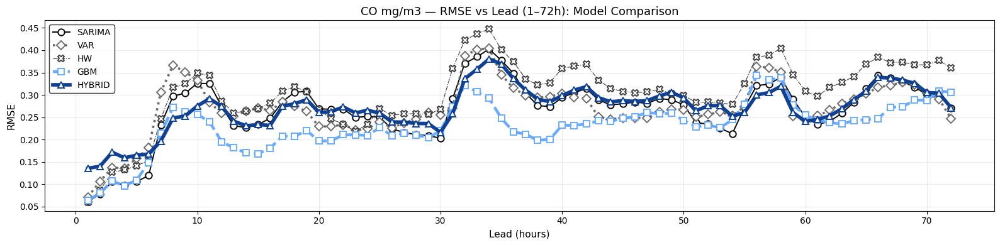

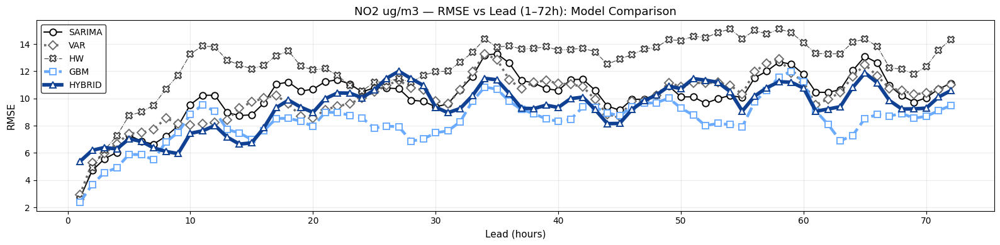

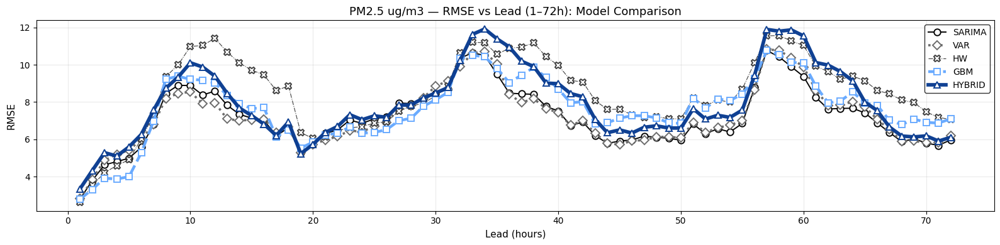

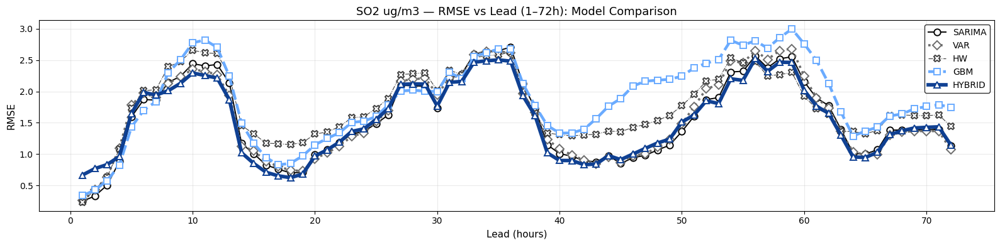


Saved outputs to: C:\Users\User\OneDrive\Desktop\thesis\Result\MODEL_COMPARISON


In [8]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ----------------------------
# Style: accessible (blue accents + grayscale) + thickness differences
# ----------------------------
plt.style.use("default")

results_dir = r"C:\Users\User\OneDrive\Desktop\thesis\Result"
OUT_DIR = os.path.join(results_dir, "MODEL_COMPARISON")
os.makedirs(OUT_DIR, exist_ok=True)

MODEL_FILES = {
    "SARIMA": os.path.join(results_dir, "SARIMA_Rolling_Univariate_NOLEAK", "SARIMA_RMSE_by_lead.csv"),
    "VAR":    os.path.join(results_dir, "VAR_CLASSIC_AllEndo_MetTimeWind_Scaled_NOLEAK", "VAR_RMSE_by_lead.csv"),
    "HW":     os.path.join(results_dir, "HOLTWINTERS_Rolling_Univariate_NOLEAK", "HOLTWINTERS_RMSE_by_lead.csv"),
    "GBM":    os.path.join(results_dir, "GBM_SyncRecursive_CrossPollutant_Lag72_Roll_EncodedWind_DOY_Impute_RMSEonly", "GBM_RMSE_by_lead.csv"),
    "HYBRID": os.path.join(results_dir, "HYBRID_WNMv3_SARIMAmetHindcast_to_GBM_EventBased_PeakWeighted_NOENDO_NOLEAK", "HYBRID_WNMv3_RMSE_by_lead.csv"),
}

# --- Visual encoding choices ---
# VAR  = light blue
# GBM  = dark blue
# others = shades of black/gray with different thickness + different linestyles + different markers
MODEL_STYLE = {
    "VAR": {
         "color": "#6A6A6A",          # mid gray
        "linestyle": ":",            # dotted
        "marker": "D",
        "linewidth": 2.6,
        
    },
    "GBM": {
        "color": "#67A9FF",          # light blue
        "linestyle": "--",
        "marker": "s",
        "linewidth": 3.2,
        
    },

    # Grayscale models: distinct darkness + distinct thickness + distinct dashes + distinct markers
    "SARIMA": {
        "color": "#000000",          # black
        "linestyle": "-",
        "marker": "o",
        "linewidth": 1.4,            # thicker black line
    },
    "HW": {
        "color": "#3A3A3A",          # dark gray
        "linestyle": "-.",
        "marker": "X",
        "linewidth": 0.8,
    },
    "HYBRID": {
        "color": "#0B3D91",          # dark blue
        "linestyle": "-",
        "marker": "^",
        "linewidth": 4.10,
    },
}

MARKERSIZE = 7.5

plt.rcParams.update({
    "axes.titlesize": 13,
    "axes.labelsize": 11,
    "legend.fontsize": 10,
    "xtick.labelsize": 10,
    "ytick.labelsize": 10,
})

# ----------------------------
# 1) normalize pollutant names
# ----------------------------
def norm_pollutant_name(s: str) -> str:
    """
    Make pollutant naming consistent across files.
    Keeps preferred display names:
      NO2 ug/m3, SO2 ug/m3, PM2.5 ug/m3, CO mg/m3, O3 ug/m3 (if present)
    """
    if s is None:
        return s
    x = str(s).strip()

    x = re.sub(r"\s+", " ", x)

    x = x.replace("PM2.5_ug/m3", "PM2.5 ug/m3")
    x = x.replace("O3_ug/m3", "O3 ug/m3")
    x = x.replace("NO2_ug/m3", "NO2 ug/m3")
    x = x.replace("SO2_ug/m3", "SO2 ug/m3")
    x = x.replace("CO_mg/m3", "CO mg/m3")
    x = x.replace("CO_mgm3", "CO mg/m3")

    x = x.replace("ugm3", "ug/m3").replace("ug/m³", "ug/m3")
    x = x.replace("NO2  ug/m3", "NO2 ug/m3").replace("SO2  ug/m3", "SO2 ug/m3")
    return x

# ----------------------------
# 2) robust CSV reader -> LONG
# ----------------------------
def load_rmse_any(path: str, model: str) -> pd.DataFrame:
    if not os.path.exists(path):
        raise FileNotFoundError(path)

    df = pd.read_csv(path)
    df.columns = [c.strip() for c in df.columns]

    lower = {c.lower(): c for c in df.columns}
    if {"pollutant", "lead", "rmse"}.issubset(lower.keys()):
        out = df[[lower["pollutant"], lower["lead"], lower["rmse"]]].copy()
        out.columns = ["pollutant", "lead", "rmse"]
    else:
        lead_col = None
        for c in df.columns:
            if c.strip().lower() == "lead":
                lead_col = c
                break
        if lead_col is None:
            if df.columns[0].lower() in ("unnamed: 0", "index"):
                df = df.rename(columns={df.columns[0]: "lead"})
                lead_col = "lead"
            else:
                raise ValueError(f"[{model}] Could not identify lead column in {path}. Columns={df.columns.tolist()}")

        pol_cols = [c for c in df.columns if c != lead_col]
        out = df.melt(id_vars=[lead_col], value_vars=pol_cols, var_name="pollutant", value_name="rmse")
        out = out.rename(columns={lead_col: "lead"})

    out["model"] = model
    out["lead"] = pd.to_numeric(out["lead"], errors="coerce")
    out["rmse"] = pd.to_numeric(out["rmse"], errors="coerce")
    out["pollutant"] = out["pollutant"].map(norm_pollutant_name)

    out = out.dropna(subset=["lead"]).copy()
    out["lead"] = out["lead"].astype(int)
    out = out[(out["lead"] >= 1) & (out["lead"] <= 72)].copy()
    return out

# ----------------------------
# 3) load all -> one long df
# ----------------------------
all_long = []
for model, path in MODEL_FILES.items():
    try:
        d = load_rmse_any(path, model)
        all_long.append(d)
        print(f"Loaded {model}: {d.shape} | pollutants={sorted(d['pollutant'].unique())}")
    except Exception as e:
        print(f"⚠️ {model} skipped: {e}")

rmse_long = pd.concat(all_long, ignore_index=True)
if rmse_long.empty:
    raise RuntimeError("No RMSE rows loaded. Check MODEL_FILES paths.")

# ----------------------------
# 4) make comparison table (avg RMSE across leads)
# ----------------------------
avg_rmse = (
    rmse_long
    .groupby(["pollutant", "model"], as_index=False)["rmse"]
    .mean()
    .rename(columns={"rmse": "avg_rmse"})
)

comp = avg_rmse.pivot(index="pollutant", columns="model", values="avg_rmse")
order = [m for m in ["SARIMA", "VAR", "HW", "GBM", "HYBRID"] if m in comp.columns]
comp = comp[order]
comp["BEST_MODEL"] = comp.idxmin(axis=1)

print("\n============== COMPARISON TABLE =================")
print(comp.round(4))

comp.round(6).to_csv(os.path.join(OUT_DIR, "comparison_table_avgRMSE.csv"))

# ----------------------------
# 5) build per-model wide tables (lead index, pollutants columns)
# ----------------------------
rmse_tables = {}
for model in rmse_long["model"].unique():
    wide = rmse_long[rmse_long["model"] == model].pivot(index="lead", columns="pollutant", values="rmse")
    wide = wide.sort_index()
    rmse_tables[model] = wide

all_pollutants = sorted(set().union(*[set(t.columns) for t in rmse_tables.values()]))

# ----------------------------
# 6) overlay plot per pollutant
# ----------------------------
for pol in all_pollutants:
    plt.figure(figsize=(16, 4))

    any_plotted = False
    for model, tab in rmse_tables.items():
        if pol not in tab.columns:
            continue

        style = MODEL_STYLE.get(model, {"color": "#000000", "linestyle": "-", "marker": "o", "linewidth": 2.5})

        plt.plot(
            tab.index,
            tab[pol],
            label=model,
            color=style["color"],
            linestyle=style["linestyle"],
            marker=style["marker"],
            linewidth=style["linewidth"],
            markersize=MARKERSIZE,
            alpha=0.98,
            markerfacecolor="white",   # boosts marker visibility on dark lines
            markeredgewidth=1.4,
        )
        any_plotted = True

    if not any_plotted:
        plt.close()
        continue

    plt.title(f"{pol} — RMSE vs Lead (1–72h): Model Comparison")
    plt.xlabel("Lead (hours)")
    plt.ylabel("RMSE")

    plt.grid(True, alpha=0.25)
    plt.legend(frameon=True, facecolor="white", edgecolor="black")
    plt.tight_layout()

    safe_name = pol.replace("/", "_").replace(" ", "_")
    plt.savefig(os.path.join(OUT_DIR, f"RMSE_overlay_{safe_name}.png"), dpi=300)
    plt.show()

print("\nSaved outputs to:", OUT_DIR)
